#### Importing library

In [ ]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from sb3_contrib import MaskablePPO
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.vec_env import SubprocVecEnv
from sb3_contrib.common.wrappers import ActionMasker
from stable_baselines3.common.callbacks import BaseCallback, EvalCallback, CallbackList
import optuna
import json
import random
import contextily as ctx
from matplotlib.lines import Line2D
import geopandas as gpd
from shapely.geometry import Point
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import warnings
warnings.filterwarnings('ignore')
import tbparse
import copy
from sb3_contrib.common.maskable.evaluation import evaluate_policy as maskable_evaluate_policy
import sys
from datetime import datetime
from collections import defaultdict, deque
from functools import reduce

c:\Users\pavol\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### GPU Enabling

In [2]:
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))
torch.set_default_device("cuda")  


CUDA available: True
GPU Name: NVIDIA GeForce GTX 1650


#### Importing CSVs

In [ ]:
#Load CSVs
demand_points = pd.read_csv(r"C:\Users\pavol\DiplomskiRad\Kod\Data\DemandPointsFinal.csv", sep=';')
shelters = pd.read_csv(r"C:\Users\pavol\DiplomskiRad\Kod\Data\EmergencyShelters.csv", sep=';')
facilities = pd.read_csv(r"C:\Users\pavol\DiplomskiRad\Kod\Data\EmergencyFacilities.csv", sep=';')

#Matrix pivoting
walking = pd.read_csv(r"C:\Users\pavol\DiplomskiRad\Kod\Data\NewWalkingMatrix.csv", sep=';')
walking.columns = walking.columns.str.strip()  # Fix BOM/spaces
dij_time = walking.pivot_table(index='DemandID', columns='EmergencyID', values='TotalTimeSec').values

driving = pd.read_csv(r"C:\Users\pavol\DiplomskiRad\Kod\Data\DrivingMatrix.csv", sep=';')
driving.columns = driving.columns.str.strip()
dlj_time = driving.pivot_table(index='FacilityID', columns='EmergencyID', values='TotalTimeSec').values

#Sort shelters
emergency_ids = sorted(walking['EmergencyID'].unique())  
shelters_sorted = shelters.set_index('ORIG_FID').reindex(sorted(walking['EmergencyID'].unique())).reset_index(drop=False)
facility_ids = sorted(driving['FacilityID'].unique())
facilities_sorted = facilities.set_index('ORIG_FID').reindex(facility_ids).reset_index(drop=False)
#API key for ctx
api_key = "cb1_3ftt_1_1e7b915a331cf5a0f9f35d5c"

In [4]:
#Comparing IDs
dm = pd.read_csv(r"C:\Users\pavol\DiplomskiRad\Kod\Data\DrivingMatrix.csv", sep=';')
dm.columns = dm.columns.str.strip()
es = pd.read_csv(r"C:\Users\pavol\DiplomskiRad\Kod\Data\EmergencyShelters.csv", sep=';')

driving_emergency_ids = set(dm['EmergencyID'].unique())
shelter_ids = set(es['ORIG_FID'].unique())

in_driving_not_shelters = sorted(driving_emergency_ids - shelter_ids)
in_shelters_not_driving = sorted(shelter_ids - driving_emergency_ids)

print(f"Driving matrix EmergencyIDs: {len(driving_emergency_ids)}")
print(f"EmergencyShelters ORIG_FID: {len(shelter_ids)}")
print(f"\nIn DrivingMatrix but NOT in EmergencyShelters ({len(in_driving_not_shelters)}):")
print(in_driving_not_shelters)
print(f"\nIn EmergencyShelters but NOT in DrivingMatrix ({len(in_shelters_not_driving)}):")
print(in_shelters_not_driving)

Driving matrix EmergencyIDs: 34
EmergencyShelters ORIG_FID: 34

In DrivingMatrix but NOT in EmergencyShelters (0):
[]

In EmergencyShelters but NOT in DrivingMatrix (0):
[]


#### Checking alignment of CSV's and columns

In [5]:
# Check alignment
print("DemandPoints ORIG_FID (sorted):", demand_points['ORIG_FID'].head().tolist())
print("Walking DemandID unique (sorted):", sorted(walking['DemandID'].unique())[:5])
print("Shelters ORIG_FID (sorted):", shelters['ORIG_FID'].head().tolist())
print("Driving EmergencyID unique (sorted):", sorted(driving['EmergencyID'].unique())[:5])
print("Facilities ORIG_FID (sorted):", facilities['ORIG_FID'].head().tolist())

DemandPoints ORIG_FID (sorted): [1, 2, 4, 6, 9]
Walking DemandID unique (sorted): [np.int64(1), np.int64(2), np.int64(4), np.int64(6), np.int64(9)]
Shelters ORIG_FID (sorted): [6, 8, 24, 26, 29]
Driving EmergencyID unique (sorted): [np.int64(6), np.int64(8), np.int64(15), np.int64(24), np.int64(26)]
Facilities ORIG_FID (sorted): [1, 2, 3, 4, 5]


In [6]:
print("Demand Points columns:", demand_points.columns.tolist())
print("Shelters columns:", shelters.columns.tolist())
print("Facilities columns:", facilities.columns.tolist())
print("Walking Matrix columns:", walking.columns.tolist())
print("Driving Matrix columns:", driving.columns.tolist())

Demand Points columns: ['Join_Count', 'TARGET_FID', 'GRID_ID', 'pointid', 'grid_code', 'ORIG_FID', 'population', 'x', 'y', 'xCoord', 'Ycoord']
Shelters columns: ['amenity', 'name', 'leisure', 'ORIG_FID', 'Area', 'CapacitySize', 'ServiceRadius', 'x', 'y', 'ServiceRadiusTime', 'ServiceTime']
Facilities columns: ['amenity', 'name', 'ORIG_FID', 'x', 'y']
Walking Matrix columns: ['CapacitySpace', 'ServiceRadiusSeconds', 'ServiceRadius', 'DemandID', 'EmergencyID', 'TotalTimeSec', 'Size', 'Length', 'ServiceRadiusSec']
Driving Matrix columns: ['Name', 'OriginID', 'DestinationID', 'DestinationRank', 'Total_Length', 'Total_Time_seconds', 'Shape_Length', 'EmergencyID', 'FacilityID', 'TotalTimeSec']


In [7]:
print("Demand Points columns:\n", demand_points[["ORIG_FID","x","y","population"]].head())
print("Shelters columns:\n", shelters_sorted[["ORIG_FID","x","y","CapacitySize","ServiceTime"]].head().to_string())
print("Facilities columns:\n", facilities[["ORIG_FID","x","y"]].head().to_string())
print("Walking Matrix columns:\n", walking[["DemandID","EmergencyID","TotalTimeSec","ServiceRadiusSec","CapacitySpace"]].head().to_string())
print("Driving Matrix columns:\n", driving[["OriginID","DestinationID","EmergencyID","FacilityID","TotalTimeSec"]].head().to_string())

Demand Points columns:
    ORIG_FID            x            y  population
0         1  355622.9979  5298235.119  239.949829
1         2  351558.8043  5301214.076   34.717300
2         4  353268.7331  5301293.399   46.257504
3         6  356800.1302  5295856.457   27.479265
4         9  356505.8472  5293647.700  123.564087
Shelters columns:
    ORIG_FID            x            y   CapacitySize  ServiceTime
0         6  350147.9991  5297825.189    5497.702746         1800
1         8  353221.5903  5294458.720   10906.937880         1800
2        15  349865.7653  5298495.029  106536.476400         1800
3        24  351235.1194  5297745.371    8152.088289         1800
4        26  350606.7626  5297188.614    2418.065621         1800
Facilities columns:
    ORIG_FID            x            y
0         1  351601.0394  5297455.945
1         2  354858.8308  5296688.575
2         3  352806.4649  5296786.076
3         4  351662.5312  5295688.695
4         5  352542.5117  5296679.455
Walking Matr

In [8]:
print("dij_time statistics:")
print("  min :", np.nanmin(dij_time))
print("  mean:", np.nanmean(dij_time))
print("  max :", np.nanmax(dij_time))
print("dlj_time statistics:")
print("  min :", np.nanmin(dlj_time))
print("  mean:", np.nanmean(dlj_time))
print("  max :", np.nanmax(dlj_time))
print("number of shelters:", shelters_sorted.shape[0])
print("number of facilities:", facilities_sorted.shape[0])
print("number of demand points:", demand_points.shape[0])   

dij_time statistics:
  min : 11.39297178
  mean: 4932.123981166805
  max : 13482.59495
dlj_time statistics:
  min : 45.67565741943842
  mean: 623.3578116866726
  max : 1700.643695628395
number of shelters: 34
number of facilities: 23
number of demand points: 835


In [9]:
print("Shelters columns:\n", shelters_sorted[["ORIG_FID","x","y","CapacitySize","ServiceTime"]].head(34).to_string())

Shelters columns:
     ORIG_FID            x            y   CapacitySize  ServiceTime
0          6  350147.9991  5297825.189    5497.702746         1800
1          8  353221.5903  5294458.720   10906.937880         1800
2         15  349865.7653  5298495.029  106536.476400         1800
3         24  351235.1194  5297745.371    8152.088289         1800
4         26  350606.7626  5297188.614    2418.065621         1800
5         29  354265.5391  5292709.855     290.594109         1440
6         42  353418.2949  5295818.136     703.225095         1800
7         52  355675.2204  5296576.325    1759.143742         1800
8         53  355089.3320  5296039.900    6756.420048         1800
9         54  354848.6186  5297357.442     791.572804         1800
10        57  351201.5604  5293305.785    8378.614607         1800
11        59  353759.1691  5296500.358      75.472816         1440
12        75  356930.7608  5301609.590     252.703870         1440
13        77  353473.9094  5294916.866    3

#### Environment

In [ ]:
class ShelterEnv(gym.Env):
    def __init__(self, demands_df, shelters_df, facilities_df, dij_time_arr, 
                 dlj_time_arr, cutoff=1800, reward_weights=None):
        super().__init__()
        
        #Loading data
        self.demands = demands_df
        self.shelters = shelters_df
        self.facilities = facilities_df

        self.dij_time = dij_time_arr   #walking matrix
        self.dlj_time = dlj_time_arr   #driving matrix

        #Default reward weights
        if reward_weights is None:
            self.w = np.array([0.4, 0.3, 0.3])
        else:
            self.w = np.array(reward_weights)

        # Dimensions and attributes
        self.m = self.demands.shape[0]  #demands
        self.n = self.shelters.shape[0]  #shelters
        self.l = self.dlj_time.shape[0]  #facilities
        self.ai = self.demands['population'].values  #population
        self.ai_norm = (
        self.ai.astype(np.float32)
        / max(np.max(self.ai), 1e-8))  
        self.b_j = self.shelters['CapacitySize'].values  #capacity
        self.rj_time = self.shelters['ServiceTime'].values  #service radius
        self.total_ai = np.sum(self.ai)
        self.cutoff = cutoff
        self.primary_ij = np.full(self.m, -1, dtype=int)
       
        self.min_facility_dist = np.array([
            np.nanmin(self.dlj_time[:, j]) for j in range(self.n)
        ], dtype=np.float32) #min facility distances
        

        #Action and observation space 
        self.action_space = spaces.Discrete(self.n)
        
        obs_size = (
            self.n +                 #x_j
            (self.m * self.n) +      #y_ij
            self.m +                 #normalized demand populations
            self.n +                 #remaining capacities
            self.n +                 #min facility distances
            2                        #coverage, step
        )
        self.observation_space = spaces.Box(low=0, high=1, shape=(obs_size,), dtype=np.float32)
        
        self.reset()

      #Baseline computation for first step  
    def _compute_candidate_baseline(self):
        return {
            "dis_fe": 0,
            "cap_fe": 0,
            "dis_fh": 0,
            "num": 0,
            "op_cap": 0.0,
            "total_cap": 0,
        }

        #Reseting the environment for a new episode
    def reset(self, seed=None, options=None):
        super().reset(seed=seed)

        #Initial environment
        self.current_step = 0
        self.x_j = np.zeros(self.n, dtype=np.float32)
        self.y_ij = np.zeros((self.m, self.n), dtype=np.float32)
        self.primary_ij = np.full(self.m, -1, dtype=int)

        #Baseline values for first step
        self.prev_metrics = self._compute_candidate_baseline()

        obs = self._get_obs()

        #Action mask
        info = {
            "action_mask": self.action_masks().astype(np.int32)
        }

        return obs, info
        
        #Action mask         
    def action_masks(self):
        mask = self.x_j == 0
        return mask.astype(np.bool_)  #returns unselected shelters = 1

        #Getting the observation for the agent
    def _get_obs(self):
        
        x_j = self.x_j.astype(np.float32) #shelter selection
        y_flat = self.y_ij.flatten().astype(np.float32) #flattened demand-shelter capability matrix

        dynamic = np.concatenate([x_j, y_flat])
        coverage = self._get_coverage()   #coverage status
        remaining_capacity = np.zeros(
            self.n,
            dtype=np.float32
        ) #remaining capacities

        for j in range(self.n):
            assigned_pop_j = np.sum(
                self.ai[self.primary_ij == j]
            )
            remaining_capacity[j] = (
                self.b_j[j] - assigned_pop_j
            )
            
        remaining_capacity_norm = (
            remaining_capacity /
            np.maximum(self.b_j, 1e-8)
        ) #normalized remaining capacities


        remaining_capacity_norm = np.clip(
            remaining_capacity_norm,
            0.0,
            1.0
        ).astype(np.float32)

        step_norm = self.current_step / self.n  #normalized step progress

        min_facility_dist_norm = (
            self.min_facility_dist / np.maximum(np.nanmax(self.dlj_time), 1e-8)
        ) #normalized minimum facility distance
        min_facility_dist_norm = np.clip(
            min_facility_dist_norm, 0.0, 1.0
        ).astype(np.float32)

        state = np.concatenate([

        dynamic,

        self.ai_norm.astype(np.float32),

        remaining_capacity_norm,
        
        
        min_facility_dist_norm,

        np.array([
            coverage,
            step_norm
        ], dtype=np.float32)

        ])

        return state

        #Calculation of variables for the rewards
    def _compute_metrics(self):
        
        #EVACUATION CALCULATION
        dis_evac = 0.0
        cap_fe = 0.0
        for i in range(self.m):
            if self.primary_ij[i] != -1:
                j = self.primary_ij[i] 
                dis_evac +=  self.dij_time[i, j] #distance addition
                cap_fe += self.ai[i]  #capacity addition
        
        # RESCUE CALCULATION
        selected_shelters = np.where(self.x_j == 1)[0]
        if len(selected_shelters) > 0:
            dis_rescue = 0.0
            for j in selected_shelters:
                facility_distances = self.dlj_time[:, j]
                closest_facility_dist = np.nanmin(facility_distances) #selecting closest facility for shelter
                
                allocated_pop = np.sum(self.ai[self.primary_ij == j]) #finding the population of the shelter
                
                dis_rescue += closest_facility_dist * allocated_pop #weighted "distance" calculation
        else:
            dis_rescue = 0.0
            
        #OVERLAP CALCULATION
        capacity_op = 0.0

        #Counting the number of shelters that can serve demand points
        for i in range(len(self.ai)):
            serving_shelters = 0
            for j in selected_shelters:
                if self.y_ij[i, j] == 1:  #servable by shelter j
                    serving_shelters += 1
        
            if serving_shelters >= 2:
                capacity_op += self.ai[i] #adding population to overlap calculation
        
        assigned_mask = self.primary_ij >= 0
        total_capacity = np.sum(self.ai[assigned_mask]) #total assigned population
        
        return {
            "dis_fe": dis_evac,
            "cap_fe": cap_fe,
            "dis_fh": dis_rescue,
            "num": selected_shelters.size,
            "op_cap": capacity_op,
            "total_cap": total_capacity,
        }

        #Environment allocation
    def _allocate_demands_to_selected_shelters(self):
        self.primary_ij = np.full(self.m, -1, dtype=int)
        self.y_ij = np.zeros((self.m, self.n), dtype=np.float32)  
        remaining_capacity = self.b_j.copy()
        
        selected = np.where(self.x_j == 1)[0]
        if len(selected) == 0:
            return
        #Find feasible shelters for each demand points based on the constraints
        for i in range(self.m):
            candidates = []
            for j in selected:
                d = self.dij_time[i, j]
                if (not np.isnan(d) and
                    d <= self.cutoff and
                    d <= self.rj_time[j]):
                    candidates.append((self.dij_time[i, j], j))
                    self.y_ij[i, j] = 1.0  #Mark as servable by shelter j
            
            if candidates:
                #Random allocation if demand has multiple feasible shelters
                if len(candidates) > 1:
                    self.np_random.shuffle(candidates)  

                #Assign to first shelter with enough capacity
                for _, best_shelter in candidates:
                    if remaining_capacity[best_shelter] >= self.ai[i]:
                        self.primary_ij[i] = best_shelter
                        remaining_capacity[best_shelter] -= self.ai[i]
                        break

        # Compute normalized metrics based on current allocation
    def _compute_normalized_metrics(self):    
        m = self.m
        
        #average evacuation time/distance
        evac_distance = 0.0
        allocated_count = 0
        for i in range(self.m):
            for j in range(self.n):
                if self.y_ij[i, j] == 1:
                    d = self.dij_time[i, j]
                    if not np.isnan(d):
                        evac_distance += d #sums the evacuation distances for all allocated demands
                        allocated_count += 1 #counts the number of allocated demands
        avg_evac_distance = evac_distance / allocated_count if allocated_count > 0 else 0.0
        
        #average rescue time/distance
        selected_shelters = np.where(self.x_j == 1)[0]
        if len(selected_shelters) > 0:
            rescue_matrix = self.dlj_time[:, selected_shelters] 
            col_min = np.nanmin(rescue_matrix, axis=0)
            rescue_distance = np.nansum(col_min) #sums the minimum rescue distances for all selected shelters
            avg_rescue_distance = rescue_distance / len(selected_shelters) #average rescue distance per selected shelter
        else:
            rescue_distance = 0.0
            avg_rescue_distance = 0.0
        num_shelters = len(selected_shelters)
        
        #Service overlap calculation
        capacity_op = 0.0
        assigned_mask = self.primary_ij >= 0
        
        for i in range(self.m):
            if not assigned_mask[i]:  #skips unassigned demand
                continue
            
            serving_shelters = 0
            #Count how many selected shelters can serve this demand
            for j in selected_shelters:
                if self.y_ij[i, j] == 1 and self.b_j[j] >= self.ai[i]:  
                    serving_shelters += 1
            
            #If 2+ shelters then it contributes to the capacity overlap
            if serving_shelters >= 2:
                capacity_op += self.ai[i]
        
        total_capacity = np.sum(self.ai[assigned_mask]) #Total capacity of assigned demands
        overlap_rate = capacity_op / total_capacity if total_capacity > 0 else 0.0 #Capacity overlap rate among assigned demands
        
        return {
        'avg_evac_distance': float(avg_evac_distance),           
        'avg_rescue_distance': float(avg_rescue_distance),       
        'overlap_rate': float(overlap_rate),                     
        'num_shelters_selected': int(num_shelters),
    }
        
        # Step function for the environment
    def step(self, action: int):
        j = int(action)  #Selecting shelter

        #Saving old metrics for calculation
        old_metrics = self.prev_metrics

        #Shelter marked as selected
        self.x_j[j] = 1
        self.current_step += 1

        #Automatic allocation of the demand
        self._allocate_demands_to_selected_shelters()

        #Computing new metrics
        new_metrics = self._compute_metrics()

        #Evacuation reward calculation
        old_dis_evac, old_cap = old_metrics["dis_fe"], old_metrics["cap_fe"]
        new_dis_evac, new_cap = new_metrics["dis_fe"], new_metrics["cap_fe"]
        
        if old_cap < 1e-8:
            r_evac = -(new_dis_evac / new_cap) if new_cap > 1e-8 else 0.0
        elif new_cap > 1e-8:
            r_evac = -(new_dis_evac / new_cap - old_dis_evac / old_cap)
        else:
            r_evac = 0.0

        #Rescue reward calculation
        old_dis_rescue, old_num = old_metrics["dis_fh"], old_metrics["num"]
        new_dis_rescue, new_num = new_metrics["dis_fh"], new_metrics["num"]
        
        if old_num < 1e-8:
            r_rescue = -(new_dis_rescue / new_num) if new_num > 1e-8 else 0.0
        elif new_num > 1e-8:
            r_rescue = -(new_dis_rescue / new_num - old_dis_rescue / old_num)
        else:
            r_rescue = 0.0

        #Overlap reward calculation 
        old_op, old_total = old_metrics["op_cap"], old_metrics["total_cap"]
        new_op, new_total = new_metrics["op_cap"], new_metrics["total_cap"]
        
        if new_total > 1e-8:
            if old_total > 1e-8:
                r_overlap = -(new_op / new_total - old_op / old_total)
            else:
                r_overlap = -(new_op / new_total)
        else:
            r_overlap = 0.0


        r_evac = 0.0 if not np.isfinite(r_evac) else r_evac
        r_rescue = 0.0 if not np.isfinite(r_rescue) else r_rescue
        r_overlap = 0.0 if not np.isfinite(r_overlap) else r_overlap


        #Saving raw values for tracking
        r_evac_raw = r_evac
        r_rescue_raw = r_rescue
        r_overlap_raw = r_overlap

        #Scaling each of the reward components
        r_evac_norm = r_evac / 0.59  
        r_rescue_norm = r_rescue / 45033.0039  
        r_overlap_norm = r_overlap / 0.23 

        #Clipping normalized reward components to prevent extreme values
        r_evac_norm = np.clip(r_evac_norm, -2.0, 2.0)
        r_rescue_norm = np.clip(r_rescue_norm, -2.0, 2.0)
        r_overlap_norm = np.clip(r_overlap_norm, -2.0, 2.0)

        #Applying weights to normalized reward components for final reward
        r_evac_weighted = r_evac_norm * self.w[0]
        r_rescue_weighted = r_rescue_norm * self.w[1]
        r_overlap_weighted = r_overlap_norm * self.w[2]
        
        #Final reward
        reward = (
            r_evac_weighted +
            r_rescue_weighted +
            r_overlap_weighted
        )
        
        #Update previous metrics
        self.prev_metrics = new_metrics
        #Coverage
        coverage = self._get_coverage()
        
        #Termination condition
        terminated =  self.current_step >= self.n
        truncated = False
        
        #Compute normalized metrics for tracking
        norm_metrics = self._compute_normalized_metrics()
        
        #Building info dict
        info = {
            "coverage": coverage,
            "reward_breakdown": {
                "r_d_raw": float(r_evac_raw),
                "r_h_raw": float(r_rescue_raw),
                "r_o_raw": float(r_overlap_raw),
                "r_d_norm": float(r_evac_norm),
                "r_h_norm": float(r_rescue_norm),
                "r_o_norm": float(r_overlap_norm),
                "r_d_weighted": float(r_evac_weighted),
                "r_h_weighted": float(r_rescue_weighted),
                "r_o_weighted": float(r_overlap_weighted),
                "Reward": float(reward)
            },
            'action_mask': self.action_masks().astype(np.int32),
            "shelter_overlap_prop": float(r_overlap_weighted),
            "multi_obj_score": float(reward),
            "valid_action_count": int(np.sum(self.action_masks())),
            "episode_termination_rate": 1.0 if terminated else 0.0,
            "avg_evac_distance": norm_metrics['avg_evac_distance'],
            "avg_rescue_distance": norm_metrics['avg_rescue_distance'],
            "overlap_rate": norm_metrics['overlap_rate'],
            "num_shelters_selected": norm_metrics['num_shelters_selected'],
        }

            
        return self._get_obs(), float(reward), terminated, truncated, info

        #Calculate coverage
    def _get_coverage(self):
        covered = (self.primary_ij >= 0).astype(np.float32)
        return float(np.sum(self.ai * covered) / self.total_ai)

In [21]:
def make_env(w=None):
    
    e = ShelterEnv(
    demands_df=demand_points,
    shelters_df=shelters_sorted,
    facilities_df=facilities_sorted,
    dij_time_arr=dij_time,
    dlj_time_arr=dlj_time,
    cutoff=1800,
    reward_weights=w
)
    e.supports_masking = True
    
    return ActionMasker(e, lambda env: env.action_masks())
    
env = make_env()
print("Env created")

Env created


In [23]:
#Random episode run
obs, _ = env.reset()
terminated = False
truncated = False
step = 0
total_reward = 0

inner_env = env.env

while not (terminated or truncated):
    mask = inner_env.action_masks()
    valid_actions = np.where(mask)[0]
    
    if len(valid_actions) == 0:
        break

    action = np.random.choice(valid_actions)
    
    obs, rew, terminated, truncated, info = inner_env.step(action)
    
    total_reward += rew

    bd = info["reward_breakdown"]

    mask_after = inner_env.action_masks()
    available_after = np.where(mask_after)[0]

    print(f"Step {step}" + f"  Available Shelters (after) = {len(available_after)}" + f"  Reward = {rew:.2f}"+ f"  Coverage = {info['coverage']:.4f}")
    print(f"  Breakdown = {{'r_d': {bd['r_d_raw']:.2f}, 'r_h': {bd['r_h_raw']:.2f}, 'r_o': {bd['r_o_raw']:.2f}}}")
    step += 1

print(f"Total Episode Reward = {total_reward:.2f}")
print(f"Final Coverage = {info['coverage']:.4f}")
print(f"Total Steps = {step}")

Step 0  Available Shelters (after) = 33  Reward = -1.40  Coverage = 0.1029
  Breakdown = {'r_d': -6.02, 'r_h': -2305593.95, 'r_o': -0.00}
Step 1  Available Shelters (after) = 32  Reward = -0.10  Coverage = 0.1783
  Breakdown = {'r_d': -1.04, 'r_h': 502956.50, 'r_o': -0.00}
Step 2  Available Shelters (after) = 31  Reward = 0.42  Coverage = 0.1828
  Breakdown = {'r_d': -0.27, 'r_h': 589427.25, 'r_o': -0.00}
Step 3  Available Shelters (after) = 30  Reward = -0.20  Coverage = 0.2019
  Breakdown = {'r_d': -1.21, 'r_h': 273844.81, 'r_o': -0.00}
Step 4  Available Shelters (after) = 29  Reward = 0.16  Coverage = 0.2085
  Breakdown = {'r_d': -0.09, 'r_h': 190502.14, 'r_o': -0.28}
Step 5  Available Shelters (after) = 28  Reward = -0.67  Coverage = 0.2343
  Breakdown = {'r_d': -1.63, 'r_h': 16212.80, 'r_o': 0.01}
Step 6  Available Shelters (after) = 27  Reward = 0.36  Coverage = 0.2377
  Breakdown = {'r_d': -0.13, 'r_h': 86114.48, 'r_o': -0.10}
Step 7  Available Shelters (after) = 26  Reward = 0.

#### Logger code

In [26]:
#Calculation of shelter utilization and coverage statistics
def get_shelter_utilization(env):
    selected_shelters = np.where(env.x_j == 1)[0]
    if len(selected_shelters) == 0:
        print("No shelters selected in this episode.")
        return None, {}

    utilization_data = []
    total_pop = np.sum(env.ai)

    for j in selected_shelters:
        # Total assigned to this shelter (with overlaps - full a_i even if shared)
        total_assigned_pop = int(np.sum(env.ai * env.y_ij[:, j]))

        # Exclusive assigned (demands assigned ONLY to this shelter)
        exclusively_assigned = (env.y_ij[:, j] == 1) & (np.sum(env.y_ij, axis=1) == 1)
        exclusive_pop = int(np.sum(env.ai[exclusively_assigned]))

        capacity = int(env.b_j[j]) if j < len(env.b_j) else 0
        total_util = (total_assigned_pop / capacity) if capacity > 0 else 0.0
        exclusive_util = (exclusive_pop / capacity) if capacity > 0 else 0.0

        utilization_data.append({
            'EmergencyID': int(env.shelters.iloc[j]['ORIG_FID']) if 'ORIG_FID' in env.shelters.columns else int(j),
            'Capacity': capacity,
            'Total Assigned': total_assigned_pop,
            'Exclusive Assigned': exclusive_pop,
            'Total Util (%)': total_util * 100,
            'Exclusive Util (%)': exclusive_util * 100
        })

    df = pd.DataFrame(utilization_data)
    if not df.empty:
        df = df.sort_values('Exclusive Util (%)', ascending=False)
    print("Shelter Capacity Utilization (per shelter):")
    print(df.round(2).to_string(index=False))

    # Global summary
    unique_covered_pop = int(np.sum(env.ai * np.minimum(1, np.sum(env.y_ij, axis=1))))
    coverage_pct = (unique_covered_pop / total_pop * 100) if total_pop > 0 else 0.0

    summary = {
        'total_population': int(total_pop),
        'unique_covered_pop': unique_covered_pop,
        'coverage_pct': coverage_pct,
        'avg_exclusive_util_pct': float(df['Exclusive Util (%)'].mean()) if not df.empty else 0.0,
    }

    print(f"\n=== GLOBAL SUMMARY ===")
    print(f"Total Population: {total_pop:,d}")
    print(f"Unique Covered Population: {unique_covered_pop:,d} ({coverage_pct:.2f}%)")
    print(f"Avg Exclusive Utilization: {summary['avg_exclusive_util_pct']:.2f}%")

    return df, summary

In [27]:
#Tracking for training, tracks per-episode coverage, steps and rewards
class CoverageLogger(BaseCallback):
    
    def __init__(self, verbose=0, log_every=10000, rolling_window=100):
        super().__init__(verbose)
        self.log_every = log_every
        self.rolling_window = rolling_window
        
        # Episode stats - tracked per environment
        self.episode_rewards = deque(maxlen=rolling_window)
        self.episode_lengths = deque(maxlen=rolling_window)
        self.episode_coverages = deque(maxlen=rolling_window)
        
        # Per-environment tracking
        self.num_envs = None
        self.running_rewards = None
        self.running_steps = None
        
        # Counters
        self.total_steps = 0
        self.total_episodes = 0

    def _safe_print(self, msg):
        """Print bypassing rich by writing to stderr."""
        sys.stderr.write(msg + "\n")
        sys.stderr.flush()

    def _on_training_start(self) -> None:
        """Initialize per-env reward trackers."""
        self.num_envs = self.training_env.num_envs
        self.running_rewards = np.zeros(self.num_envs, dtype=float)
        self.running_steps = np.zeros(self.num_envs, dtype=int)
        self.total_steps = 0
        self.total_episodes = 0
        
        self._safe_print("\n" + "="*80)
        self._safe_print(f"TRAINING START: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
        self._safe_print(f"Environments: {self.num_envs} | Rolling Window: {self.rolling_window}")
        self._safe_print("="*80 + "\n")

    def _on_step(self) -> bool:
        """Called at every timestep."""
        self.total_steps += 1
        
        # Accumulate rewards and steps
        rewards = self.locals.get("rewards", None)
        if rewards is not None:
            try:
                arr = np.asarray(rewards)
                if arr.shape == self.running_rewards.shape:
                    self.running_rewards += arr
            except Exception:
                pass
        
        # Increment step count for each environment
        self.running_steps += 1
        
        # Handle episode endings
        infos = self.locals.get("infos", [])
        dones = self.locals.get("dones", [])
        
        if any(dones):
            for env_idx, done in enumerate(dones):
                if done:
                    self.total_episodes += 1
                    
                    # Extract episode stats
                    info = infos[env_idx] if env_idx < len(infos) else {}
                    final_coverage = info.get("coverage", 0.0) if isinstance(info, dict) else 0.0
                    final_reward = self.running_rewards[env_idx]
                    final_steps = int(self.running_steps[env_idx])
                    
                    # Track for rolling window
                    self.episode_rewards.append(final_reward)
                    self.episode_lengths.append(final_steps)
                    self.episode_coverages.append(final_coverage)
                    
                    # Log to tensorboard (TensorBoard will handle visualization)
                    self.logger.record("episode/reward", final_reward)
                    self.logger.record("episode/length", final_steps)
                    self.logger.record("episode/coverage", final_coverage)
                    self.logger.record("episode/mean_reward_window", np.mean(self.episode_rewards))
                    self.logger.record("episode/mean_coverage_window", np.mean(self.episode_coverages))
                    self.logger.record("episode/mean_length_window", np.mean(self.episode_lengths))
                    
                    # Reset this env's accumulators
                    self.running_rewards[env_idx] = 0.0
                    self.running_steps[env_idx] = 0
        
        # Periodic logging to console
        if self.total_steps % self.log_every == 0:
            self._print_progress()
        
        return True

    def _print_progress(self) -> None:
        """Print current training progress."""
        
        if self.episode_rewards:
            mean_rew = np.mean(self.episode_rewards)
            std_rew = np.std(self.episode_rewards)
            mean_len = np.mean(self.episode_lengths)
            mean_cov = np.mean(self.episode_coverages)
            max_cov = np.max(self.episode_coverages)
        else:
            mean_rew = std_rew = mean_len = mean_cov = max_cov = 0.0
        
        self._safe_print(
            f"Step {self.total_steps:,} | Episodes: {self.total_episodes:,} | "
            f"Reward: {mean_rew:8.2f}±{std_rew:6.2f} | "
            f"Length: {mean_len:6.1f} | Coverage: {mean_cov:.4f} (max: {max_cov:.4f})"
        )

    def _on_training_end(self) -> None:
        """Print final summary."""
        
        if self.episode_rewards:
            mean_rew = np.mean(self.episode_rewards)
            std_rew = np.std(self.episode_rewards)
            mean_cov = np.mean(self.episode_coverages)
            max_cov = np.max(self.episode_coverages)
            mean_len = np.mean(self.episode_lengths)
        else:
            mean_rew = std_rew = mean_cov = max_cov = mean_len = 0.0
        
        self._safe_print(f"Total Steps:     {self.total_steps:,}")
        self._safe_print(f"Total Episodes:  {self.total_episodes}")
        self._safe_print(f"\nFinal Metrics (last {self.rolling_window} episodes):")
        self._safe_print(f"  Reward:       {mean_rew:.3f} ± {std_rew:.3f}")
        self._safe_print(f"  Episode Len:  {mean_len:.1f}")
        self._safe_print(f"  Coverage:     {mean_cov:.4f} (max: {max_cov:.4f})")


#### Hypertuning

In [ ]:
n_eval_episodes = 5
n_timesteps = 30000  #Total timesteps per trial
n_steps = 34  #Due to the number of shelters

def objective(trial):
    vec_env = None
    test_env = None
    model = None
    try:
        #Hyperparameter suggestions
        w1 = trial.suggest_float("w1", 0.0, 1.0, step=0.05)
        w2 = trial.suggest_float("w2", 0.0, 1.0, step=0.05)
        w3 = trial.suggest_float("w3", 0.0, 1.0, step=0.05)
        w_sum = w1 + w2 + w3
        if w_sum == 0:
            w_sum = 1.0
        w = np.array([w1 / w_sum, w2 / w_sum, w3 / w_sum])

        lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
        n_epochs = trial.suggest_int("n_epochs", 8, 20)
        ent_coef = trial.suggest_float("ent_coef", 0.001, 0.1, log=True)
        gae_lambda = trial.suggest_float("gae_lambda", 0.85, 0.99)
        vf_coef = trial.suggest_float("vf_coef", 0.5, 0.8)
        clip_range = trial.suggest_float("clip_range", 0.1, 0.4)
        batch_size = 136
        gamma = trial.suggest_float("gamma", 0.95, 0.99)
        clip_range_vf = trial.suggest_float("clip_range_vf", 0.1, 0.3)
        target_kl = trial.suggest_float("target_kl", 0.01, 0.05)
        net_arch_options = trial.suggest_categorical("net_arch", [(64, 64), (128, 128), (128, 64), (256, 128)])

        #Env setup
        num_envs = 4
        vec_env = SubprocVecEnv([lambda i=i, w=w: make_env(w) for i in range(num_envs)])

        #Model setup
        device = "cuda" if torch.cuda.is_available() else "cpu"
        model = MaskablePPO(
            "MlpPolicy",
            vec_env,
            device=device,
            learning_rate=lr,
            n_steps=n_steps,
            batch_size=batch_size,
            n_epochs=n_epochs,
            gamma=gamma,
            gae_lambda=gae_lambda,
            clip_range=clip_range,
            ent_coef=ent_coef,
            vf_coef=vf_coef,
            target_kl=target_kl,
            clip_range_vf=clip_range_vf,
            policy_kwargs={"net_arch": list(net_arch_options), "activation_fn": nn.Tanh},
            verbose=0,
            tensorboard_log=f"./ppo_tuning/trial_{trial.number}/",
            seed=trial.number,
        )

        #Training
        model.learn(total_timesteps=n_timesteps, progress_bar=False)

        #Evaluation
        test_env = SubprocVecEnv([lambda i=i, w=w: make_env(w) for i in range(num_envs)])

        mean_eval_reward, std_eval_reward = maskable_evaluate_policy(
            model, test_env, n_eval_episodes=n_eval_episodes, deterministic=True, return_episode_rewards=False
        )

        #Optuna pruning
        trial.report(mean_eval_reward, step=n_timesteps)
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

        #Results for post-analysis
        trial.set_user_attr("weights", w.tolist())
        trial.set_user_attr("eval_reward", float(mean_eval_reward))
        trial.set_user_attr("eval_std", float(std_eval_reward))

        #Summary of trial
        print(f"\n{'='*70}")
        print(f"Trial {trial.number} Complete")
        print(f"{'='*70}")
        print(f"  Weights (normalized): w1={w[0]:.3f}, w2={w[1]:.3f}, w3={w[2]:.3f}")
        print(f"  LR={lr:.2e}, Epochs={n_epochs}, Gamma={gamma:.3f}")
        print(f"  Net Arch: {net_arch_options}")
        print(f"  Eval Reward: {mean_eval_reward:.3f} ± {std_eval_reward:.3f}")
        print(f"{'='*70}\n")

        return float(mean_eval_reward)

    except optuna.exceptions.TrialPruned:
        raise
    except Exception as e:
        print(f"Trial {trial.number} failed: {e}")
        import traceback
        traceback.print_exc()
        return float("-inf")
    finally:
        try:
            if model is not None:
                del model
        except Exception:
            pass
        try:
            if vec_env is not None:
                vec_env.close()
        except Exception:
            pass
        try:
            if test_env is not None:
                test_env.close()
        except Exception:
            pass
        try:
            torch.cuda.empty_cache()
        except Exception:
            pass


def trial_end_callback(study, trial):
    best_trial = study.best_trial
    print(f"\n[BEST SO FAR] Trial {best_trial.number} - Eval Reward: {best_trial.value:.3f}")


study = optuna.create_study(
    direction="maximize",
    pruner=optuna.pruners.MedianPruner(n_startup_trials=5),
    sampler=optuna.samplers.TPESampler(seed=42),
)
study.optimize(objective, n_trials=30, timeout=39600, callbacks=[trial_end_callback], show_progress_bar=True)

# --- Print final results ---
print(f"\n{'='*70}")
print("OPTIMIZATION COMPLETE")
print(f"{'='*70}")
print(f"Best Trial: {study.best_trial.number}")
print(f"Best Eval Reward: {study.best_value:.4f}")
print(f"Total trials completed: {len(study.trials)}")
print(f"\nBest Hyperparameters:")
for key, value in study.best_params.items():
    if isinstance(value, float):
        print(f"  {key}: {value:.4f}")
    else:
        print(f"  {key}: {value}")

best_trial = study.best_trial
w_best = best_trial.user_attrs.get("weights", [0, 0, 0])
print(f"\nBest Weights (normalized): w1={w_best[0]:.4f}, w2={w_best[1]:.4f}, w3={w_best[2]:.4f}")

# Save results
results = {
    "best_trial_number": study.best_trial.number,
    "best_eval_reward": float(study.best_value),
    "best_params": study.best_params,
    "best_trial_attrs": study.best_trial.user_attrs,
    "n_trials": len(study.trials),
}
with open("tuning_results_12082026_final.json", "w") as f:
    json.dump(results, f, indent=2)
print(f"\nResults saved to: tuning_results_12082026_final.json")

[I 2026-08-12 11:54:33,009] A new study created in memory with name: no-name-96e02737-ebbb-447e-a84e-4771f7853f04
  0%|          | 0/30 [00:00<?, ?it/s]


Trial 0 Complete
  Weights (normalized): w1=0.171, w2=0.463, w3=0.366
  LR=1.58e-04, Epochs=10, Gamma=0.978
  Net Arch: (64, 64)
  Eval Reward: 8.200 ± 0.061



Best trial: 0. Best value: 8.19976:   3%|▎         | 1/30 [11:59<5:47:40, 719.34s/it, 719.34/39600 seconds]

[I 2026-08-12 12:06:32,352] Trial 0 finished with value: 8.19976208041381 and parameters: {'w1': 0.35000000000000003, 'w2': 0.9500000000000001, 'w3': 0.75, 'lr': 0.00015751320499779721, 'n_epochs': 10, 'ent_coef': 0.002051110418843397, 'gae_lambda': 0.8581317057035479, 'vf_coef': 0.7598528437324805, 'clip_range': 0.2803345035229627, 'gamma': 0.9783229031118418, 'clip_range_vf': 0.10411689885916049, 'target_kl': 0.048796394086479775, 'net_arch': (64, 64)}. Best is trial 0 with value: 8.19976208041381.

[BEST SO FAR] Trial 0 - Eval Reward: 8.200

Trial 1 Complete
  Weights (normalized): w1=0.231, w2=0.423, w3=0.346
  LR=3.82e-05, Epochs=15, Gamma=0.981
  Net Arch: (128, 64)
  Eval Reward: 6.262 ± 0.079



Best trial: 0. Best value: 8.19976:   7%|▋         | 2/30 [24:29<5:44:08, 737.43s/it, 1469.43/39600 seconds]

[I 2026-08-12 12:19:02,447] Trial 1 finished with value: 6.2622512393661145 and parameters: {'w1': 0.30000000000000004, 'w2': 0.55, 'w3': 0.45, 'lr': 3.8234752246751835e-05, 'n_epochs': 15, 'ent_coef': 0.0019010245319870357, 'gae_lambda': 0.8909002507949305, 'vf_coef': 0.6099085529881075, 'clip_range': 0.2368209952651108, 'gamma': 0.9814070384557205, 'clip_range_vf': 0.13993475643167194, 'target_kl': 0.030569377536544463, 'net_arch': (128, 64)}. Best is trial 0 with value: 8.19976208041381.

[BEST SO FAR] Trial 0 - Eval Reward: 8.200

Trial 2 Complete
  Weights (normalized): w1=0.025, w2=0.475, w3=0.500
  LR=4.14e-04, Epochs=11, Gamma=0.970
  Net Arch: (128, 128)
  Eval Reward: 8.650 ± 0.034



Best trial: 2. Best value: 8.64967:  10%|█         | 3/30 [36:36<5:29:41, 732.65s/it, 2196.40/39600 seconds]

[I 2026-08-12 12:31:09,411] Trial 2 finished with value: 8.649672510951284 and parameters: {'w1': 0.05, 'w2': 0.9500000000000001, 'w3': 1.0, 'lr': 0.0004138040112561013, 'n_epochs': 11, 'ent_coef': 0.0015679933916723015, 'gae_lambda': 0.9457926237117019, 'vf_coef': 0.6320457481218804, 'clip_range': 0.13661147045343366, 'gamma': 0.9698070764044507, 'clip_range_vf': 0.10687770422304368, 'target_kl': 0.04637281608315129, 'net_arch': (128, 128)}. Best is trial 2 with value: 8.649672510951284.

[BEST SO FAR] Trial 2 - Eval Reward: 8.650

Trial 3 Complete
  Weights (normalized): w1=0.324, w2=0.088, w3=0.588
  LR=3.55e-04, Epochs=20, Gamma=0.958
  Net Arch: (128, 64)
  Eval Reward: 10.361 ± 0.132



Best trial: 3. Best value: 10.3605:  13%|█▎        | 4/30 [49:30<5:24:36, 749.11s/it, 2970.74/39600 seconds]

[I 2026-08-12 12:44:03,747] Trial 3 finished with value: 10.360526836385985 and parameters: {'w1': 0.55, 'w2': 0.15000000000000002, 'w3': 1.0, 'lr': 0.0003550304858128307, 'n_epochs': 20, 'ent_coef': 0.06161049539380966, 'gae_lambda': 0.933705997033552, 'vf_coef': 0.776562270506935, 'clip_range': 0.12654775061557585, 'gamma': 0.9578393144967657, 'clip_range_vf': 0.10904545778210761, 'target_kl': 0.023013213230530575, 'net_arch': (128, 64)}. Best is trial 3 with value: 10.360526836385985.

[BEST SO FAR] Trial 3 - Eval Reward: 10.361

Trial 4 Complete
  Weights (normalized): w1=0.278, w2=0.611, w3=0.111
  LR=4.02e-04, Epochs=8, Gamma=0.983
  Net Arch: (64, 64)
  Eval Reward: 13.059 ± 0.154



Best trial: 4. Best value: 13.0585:  17%|█▋        | 5/30 [1:01:29<5:07:31, 738.07s/it, 3689.23/39600 seconds]

[I 2026-08-12 12:56:02,240] Trial 4 finished with value: 13.058543728886969 and parameters: {'w1': 0.25, 'w2': 0.55, 'w3': 0.1, 'lr': 0.0004021554526690286, 'n_epochs': 8, 'ent_coef': 0.09413993046829945, 'gae_lambda': 0.9581142677015321, 'vf_coef': 0.5596147044602517, 'clip_range': 0.10165663513708073, 'gamma': 0.9826184571381934, 'clip_range_vf': 0.24137146876952342, 'target_kl': 0.039160286721639494, 'net_arch': (64, 64)}. Best is trial 4 with value: 13.058543728886969.

[BEST SO FAR] Trial 4 - Eval Reward: 13.059


Best trial: 4. Best value: 13.0585:  20%|██        | 6/30 [1:13:28<4:52:43, 731.83s/it, 4408.94/39600 seconds]

[I 2026-08-12 13:08:01,954] Trial 5 pruned. 

[BEST SO FAR] Trial 4 - Eval Reward: 13.059


Best trial: 4. Best value: 13.0585:  23%|██▎       | 7/30 [1:24:56<4:34:59, 717.36s/it, 5096.52/39600 seconds]

[I 2026-08-12 13:19:29,537] Trial 6 pruned. 

[BEST SO FAR] Trial 4 - Eval Reward: 13.059

Trial 7 Complete
  Weights (normalized): w1=0.396, w2=0.333, w3=0.271
  LR=5.53e-04, Epochs=18, Gamma=0.986
  Net Arch: (256, 128)
  Eval Reward: 10.237 ± 0.287



Best trial: 4. Best value: 13.0585:  27%|██▋       | 8/30 [1:36:43<4:21:49, 714.07s/it, 5803.54/39600 seconds]

[I 2026-08-12 13:31:16,550] Trial 7 finished with value: 10.236920601330826 and parameters: {'w1': 0.9500000000000001, 'w2': 0.8, 'w3': 0.65, 'lr': 0.0005532496914298506, 'n_epochs': 18, 'ent_coef': 0.0023612399244412607, 'gae_lambda': 0.9749582597885968, 'vf_coef': 0.6618026725746953, 'clip_range': 0.3422320465492188, 'gamma': 0.9858436519969397, 'clip_range_vf': 0.16360069499437277, 'target_kl': 0.01440207698110707, 'net_arch': (256, 128)}. Best is trial 4 with value: 13.058543728886969.

[BEST SO FAR] Trial 4 - Eval Reward: 13.059


Best trial: 4. Best value: 13.0585:  30%|███       | 9/30 [1:48:49<4:11:14, 717.83s/it, 6529.63/39600 seconds]

[I 2026-08-12 13:43:22,640] Trial 8 pruned. 

[BEST SO FAR] Trial 4 - Eval Reward: 13.059

Trial 9 Complete
  Weights (normalized): w1=0.294, w2=0.000, w3=0.706
  LR=1.01e-04, Epochs=8, Gamma=0.970
  Net Arch: (128, 128)
  Eval Reward: 12.602 ± 0.476



Best trial: 4. Best value: 13.0585:  33%|███▎      | 10/30 [2:00:30<3:57:32, 712.63s/it, 7230.61/39600 seconds]

[I 2026-08-12 13:55:03,625] Trial 9 finished with value: 12.601766647825318 and parameters: {'w1': 0.25, 'w2': 0.0, 'w3': 0.6000000000000001, 'lr': 0.00010124137770478642, 'n_epochs': 8, 'ent_coef': 0.0036082193273637873, 'gae_lambda': 0.9771572240353315, 'vf_coef': 0.5718685672000917, 'clip_range': 0.14346846162736693, 'gamma': 0.9695781104111025, 'clip_range_vf': 0.29713009082212016, 'target_kl': 0.019682210860460018, 'net_arch': (128, 128)}. Best is trial 4 with value: 13.058543728886969.

[BEST SO FAR] Trial 4 - Eval Reward: 13.059

Trial 10 Complete
  Weights (normalized): w1=0.682, w2=0.318, w3=0.000
  LR=7.89e-04, Epochs=14, Gamma=0.990
  Net Arch: (64, 64)
  Eval Reward: 15.655 ± 0.199



Best trial: 10. Best value: 15.6548:  37%|███▋      | 11/30 [2:12:49<3:48:13, 720.72s/it, 7969.69/39600 seconds]

[I 2026-08-12 14:07:22,699] Trial 10 finished with value: 15.654764111662606 and parameters: {'w1': 0.75, 'w2': 0.35000000000000003, 'w3': 0.0, 'lr': 0.0007889558773781963, 'n_epochs': 14, 'ent_coef': 0.06536264082965737, 'gae_lambda': 0.9091851855027264, 'vf_coef': 0.5038643448510695, 'clip_range': 0.20043855286697093, 'gamma': 0.9896945066184134, 'clip_range_vf': 0.2419872541996977, 'target_kl': 0.03234098923117161, 'net_arch': (64, 64)}. Best is trial 10 with value: 15.654764111662606.

[BEST SO FAR] Trial 10 - Eval Reward: 15.655

Trial 11 Complete
  Weights (normalized): w1=0.737, w2=0.263, w3=0.000
  LR=9.74e-04, Epochs=14, Gamma=0.990
  Net Arch: (64, 64)
  Eval Reward: 16.689 ± 0.232



Best trial: 11. Best value: 16.6886:  40%|████      | 12/30 [2:25:12<3:38:14, 727.48s/it, 8712.62/39600 seconds]

[I 2026-08-12 14:19:45,635] Trial 11 finished with value: 16.68855325898612 and parameters: {'w1': 0.7000000000000001, 'w2': 0.25, 'w3': 0.0, 'lr': 0.0009744082582253171, 'n_epochs': 14, 'ent_coef': 0.08045862445557919, 'gae_lambda': 0.9042631885689545, 'vf_coef': 0.5182045696078854, 'clip_range': 0.19653015328007947, 'gamma': 0.9898865899100227, 'clip_range_vf': 0.2411946470793715, 'target_kl': 0.03273644623852348, 'net_arch': (64, 64)}. Best is trial 11 with value: 16.68855325898612.

[BEST SO FAR] Trial 11 - Eval Reward: 16.689

Trial 12 Complete
  Weights (normalized): w1=0.652, w2=0.174, w3=0.174
  LR=9.64e-04, Epochs=15, Gamma=0.990
  Net Arch: (64, 64)
  Eval Reward: 15.045 ± 0.277



Best trial: 11. Best value: 16.6886:  43%|████▎     | 13/30 [2:37:43<3:28:08, 734.62s/it, 9463.69/39600 seconds]

[I 2026-08-12 14:32:16,699] Trial 12 finished with value: 15.044782218112848 and parameters: {'w1': 0.75, 'w2': 0.2, 'w3': 0.2, 'lr': 0.0009638809354778291, 'n_epochs': 15, 'ent_coef': 0.03080798000126696, 'gae_lambda': 0.9043864740586814, 'vf_coef': 0.5058871112930667, 'clip_range': 0.19367048077663498, 'gamma': 0.989958227532824, 'clip_range_vf': 0.23245685358020848, 'target_kl': 0.029155366322706593, 'net_arch': (64, 64)}. Best is trial 11 with value: 16.68855325898612.

[BEST SO FAR] Trial 11 - Eval Reward: 16.689


Best trial: 11. Best value: 16.6886:  47%|████▋     | 14/30 [2:49:57<3:15:50, 734.38s/it, 10197.49/39600 seconds]

[I 2026-08-12 14:44:30,504] Trial 13 pruned. 

[BEST SO FAR] Trial 11 - Eval Reward: 16.689

Trial 14 Complete
  Weights (normalized): w1=0.750, w2=0.050, w3=0.200
  LR=1.90e-04, Epochs=16, Gamma=0.989
  Net Arch: (256, 128)
  Eval Reward: 16.631 ± 0.347



Best trial: 11. Best value: 16.6886:  50%|█████     | 15/30 [3:04:44<3:15:04, 780.30s/it, 11084.21/39600 seconds]

[I 2026-08-12 14:59:17,220] Trial 14 finished with value: 16.63129808827734 and parameters: {'w1': 0.75, 'w2': 0.05, 'w3': 0.2, 'lr': 0.0001900802228822253, 'n_epochs': 16, 'ent_coef': 0.01561992730090702, 'gae_lambda': 0.8738516331477785, 'vf_coef': 0.5332145695608317, 'clip_range': 0.18649795831750554, 'gamma': 0.9894866031914515, 'clip_range_vf': 0.28004296735660084, 'target_kl': 0.03438462531693397, 'net_arch': (256, 128)}. Best is trial 11 with value: 16.68855325898612.

[BEST SO FAR] Trial 11 - Eval Reward: 16.689

Trial 15 Complete
  Weights (normalized): w1=0.706, w2=0.059, w3=0.235
  LR=1.93e-04, Epochs=17, Gamma=0.977
  Net Arch: (256, 128)
  Eval Reward: 19.577 ± 0.421



Best trial: 15. Best value: 19.5768:  53%|█████▎    | 16/30 [3:21:41<3:18:41, 851.53s/it, 12101.15/39600 seconds]

[I 2026-08-12 15:16:14,161] Trial 15 finished with value: 19.57678843297371 and parameters: {'w1': 0.6000000000000001, 'w2': 0.05, 'w3': 0.2, 'lr': 0.00019306113771910897, 'n_epochs': 17, 'ent_coef': 0.01404038235897597, 'gae_lambda': 0.8542670969621217, 'vf_coef': 0.5613775891144089, 'clip_range': 0.3003377348752277, 'gamma': 0.9769949162884938, 'clip_range_vf': 0.2931241136392397, 'target_kl': 0.02285715844818437, 'net_arch': (256, 128)}. Best is trial 15 with value: 19.57678843297371.

[BEST SO FAR] Trial 15 - Eval Reward: 19.577

Trial 16 Complete
  Weights (normalized): w1=0.611, w2=0.167, w3=0.222
  LR=6.43e-05, Epochs=17, Gamma=0.975
  Net Arch: (256, 128)
  Eval Reward: 15.217 ± 0.274



Best trial: 15. Best value: 19.5768:  57%|█████▋    | 17/30 [3:37:05<3:09:15, 873.48s/it, 13025.70/39600 seconds]

[I 2026-08-12 15:31:38,710] Trial 16 finished with value: 15.216939248656825 and parameters: {'w1': 0.55, 'w2': 0.15000000000000002, 'w3': 0.2, 'lr': 6.42900218497509e-05, 'n_epochs': 17, 'ent_coef': 0.008859897369160348, 'gae_lambda': 0.8560481189357374, 'vf_coef': 0.5612923518715086, 'clip_range': 0.3102917675955485, 'gamma': 0.975229411891865, 'clip_range_vf': 0.2692861008481554, 'target_kl': 0.02355018184116251, 'net_arch': (256, 128)}. Best is trial 15 with value: 19.57678843297371.

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  60%|██████    | 18/30 [3:50:03<2:48:56, 844.73s/it, 13803.47/39600 seconds]

[I 2026-08-12 15:44:36,487] Trial 17 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577

Trial 18 Complete
  Weights (normalized): w1=0.727, w2=0.091, w3=0.182
  LR=8.70e-05, Epochs=17, Gamma=0.974
  Net Arch: (256, 128)
  Eval Reward: 17.312 ± 0.280



Best trial: 15. Best value: 19.5768:  63%|██████▎   | 19/30 [4:02:39<2:30:00, 818.19s/it, 14559.86/39600 seconds]

[I 2026-08-12 15:57:12,874] Trial 18 finished with value: 17.31240258332438 and parameters: {'w1': 0.4, 'w2': 0.05, 'w3': 0.1, 'lr': 8.702212187289826e-05, 'n_epochs': 17, 'ent_coef': 0.017025298677185628, 'gae_lambda': 0.9307410421968837, 'vf_coef': 0.5393154789301973, 'clip_range': 0.24353562507318738, 'gamma': 0.97409256080101, 'clip_range_vf': 0.2639945998375266, 'target_kl': 0.011176356468395278, 'net_arch': (256, 128)}. Best is trial 15 with value: 19.57678843297371.

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  67%|██████▋   | 20/30 [4:15:11<2:13:01, 798.11s/it, 15311.18/39600 seconds]

[I 2026-08-12 16:09:44,190] Trial 19 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577

Trial 20 Complete
  Weights (normalized): w1=0.381, w2=0.095, w3=0.524
  LR=5.19e-05, Epochs=20, Gamma=0.974
  Net Arch: (256, 128)
  Eval Reward: 17.175 ± 0.492



Best trial: 15. Best value: 19.5768:  70%|███████   | 21/30 [4:28:35<1:59:59, 799.94s/it, 16115.38/39600 seconds]

[I 2026-08-12 16:23:08,390] Trial 20 finished with value: 17.175363253011017 and parameters: {'w1': 0.4, 'w2': 0.1, 'w3': 0.55, 'lr': 5.1924196896839354e-05, 'n_epochs': 20, 'ent_coef': 0.03164554728239428, 'gae_lambda': 0.9343713238989263, 'vf_coef': 0.5422893653284534, 'clip_range': 0.3247088302080987, 'gamma': 0.9738610023649352, 'clip_range_vf': 0.26825707402875154, 'target_kl': 0.010555902327160673, 'net_arch': (256, 128)}. Best is trial 15 with value: 19.57678843297371.

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  73%|███████▎  | 22/30 [4:41:25<1:45:27, 791.00s/it, 16885.52/39600 seconds]

[I 2026-08-12 16:35:58,534] Trial 21 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577

Trial 22 Complete
  Weights (normalized): w1=0.400, w2=0.000, w3=0.600
  LR=1.22e-04, Epochs=18, Gamma=0.966
  Net Arch: (256, 128)
  Eval Reward: 15.712 ± 0.521



Best trial: 15. Best value: 19.5768:  77%|███████▋  | 23/30 [4:54:37<1:32:18, 791.28s/it, 17677.48/39600 seconds]

[I 2026-08-12 16:49:10,488] Trial 22 finished with value: 15.711938557083112 and parameters: {'w1': 0.5, 'w2': 0.0, 'w3': 0.75, 'lr': 0.00012213808914514096, 'n_epochs': 18, 'ent_coef': 0.012491463504924182, 'gae_lambda': 0.928869567268112, 'vf_coef': 0.5413300911569655, 'clip_range': 0.2782192663916804, 'gamma': 0.9657287079995879, 'clip_range_vf': 0.2633807752426661, 'target_kl': 0.014345258973545348, 'net_arch': (256, 128)}. Best is trial 15 with value: 19.57678843297371.

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  80%|████████  | 24/30 [5:06:49<1:17:20, 773.44s/it, 18409.27/39600 seconds]

[I 2026-08-12 17:01:22,287] Trial 23 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  83%|████████▎ | 25/30 [5:18:58<1:03:21, 760.20s/it, 19138.60/39600 seconds]

[I 2026-08-12 17:13:31,612] Trial 24 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577

Trial 25 Complete
  Weights (normalized): w1=0.667, w2=0.000, w3=0.333
  LR=2.50e-04, Epochs=19, Gamma=0.982
  Net Arch: (256, 128)
  Eval Reward: 16.472 ± 0.268



Best trial: 15. Best value: 19.5768:  87%|████████▋ | 26/30 [5:31:07<50:03, 750.85s/it, 19867.65/39600 seconds]  

[I 2026-08-12 17:25:40,662] Trial 25 finished with value: 16.47230101846131 and parameters: {'w1': 0.2, 'w2': 0.0, 'w3': 0.1, 'lr': 0.00025028556035800185, 'n_epochs': 19, 'ent_coef': 0.03944326185450495, 'gae_lambda': 0.926792860861167, 'vf_coef': 0.5436536694051781, 'clip_range': 0.39842260335739765, 'gamma': 0.9824044640390216, 'clip_range_vf': 0.2591895608364762, 'target_kl': 0.017713704070913976, 'net_arch': (256, 128)}. Best is trial 15 with value: 19.57678843297371.

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  90%|█████████ | 27/30 [5:43:45<37:38, 752.93s/it, 20625.43/39600 seconds]

[I 2026-08-12 17:38:18,440] Trial 26 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  93%|█████████▎| 28/30 [5:56:27<25:11, 755.74s/it, 21387.72/39600 seconds]

[I 2026-08-12 17:51:00,738] Trial 27 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768:  97%|█████████▋| 29/30 [6:08:27<12:24, 744.98s/it, 22107.59/39600 seconds]

[I 2026-08-12 18:03:00,607] Trial 28 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577


Best trial: 15. Best value: 19.5768: 100%|██████████| 30/30 [6:20:00<00:00, 760.02s/it, 22800.68/39600 seconds]

[I 2026-08-12 18:14:33,692] Trial 29 pruned. 

[BEST SO FAR] Trial 15 - Eval Reward: 19.577

OPTIMIZATION COMPLETE
Best Trial: 15
Best Eval Reward: 19.5768
Total trials completed: 30

Best Hyperparameters:
  w1: 0.6000
  w2: 0.0500
  w3: 0.2000
  lr: 0.0002
  n_epochs: 17
  ent_coef: 0.0140
  gae_lambda: 0.8543
  vf_coef: 0.5614
  clip_range: 0.3003
  gamma: 0.9770
  clip_range_vf: 0.2931
  target_kl: 0.0229
  net_arch: (256, 128)

Best Weights (normalized): w1=0.7059, w2=0.0588, w3=0.2353

Results saved to: tuning_results_12082026_final.json


#### Hypertuning parameters

In [ ]:
#Save hyperparameters
with open("tuning_results_12082026_final.json", "r") as f:
    tuning_results = json.load(f)

best_params = tuning_results["best_params"]
print(f"Best eval reward: {tuning_results['best_eval_reward']:.4f}")
print(f"Best params: {best_params}")

Best eval reward: 19.5768
Best params: {'w1': 0.6000000000000001, 'w2': 0.05, 'w3': 0.2, 'lr': 0.00019306113771910897, 'n_epochs': 17, 'ent_coef': 0.01404038235897597, 'gae_lambda': 0.8542670969621217, 'vf_coef': 0.5613775891144089, 'clip_range': 0.3003377348752277, 'gamma': 0.9769949162884938, 'clip_range_vf': 0.2931241136392397, 'target_kl': 0.02285715844818437, 'net_arch': [256, 128]}


In [ ]:
#Normalize weights
best_w1 = best_params["w1"]
best_w2 = best_params["w2"]
best_w3 = best_params["w3"]
best_w_sum = best_w1 + best_w2 + best_w3
if best_w_sum == 0:
    best_w_sum = 1.0
best_w = np.array([best_w1 / best_w_sum, best_w2 / best_w_sum, best_w3 / best_w_sum])
print(f"Normalized best w: {best_w}")
np.save("best_w.npy", best_w)

Normalized best w: [0.70588235 0.05882353 0.23529412]


In [ ]:
#Build the algo params dict for training
net_arch = best_params["net_arch"]
if isinstance(net_arch, str):
    net_arch = eval(net_arch)
net_arch = list(net_arch)

algo_params = {
    "learning_rate": best_params["lr"],
    "n_epochs": best_params["n_epochs"],
    "ent_coef": best_params["ent_coef"],
    "gae_lambda": best_params["gae_lambda"],
    "vf_coef": best_params["vf_coef"],
    "clip_range": best_params["clip_range"],
    "clip_range_vf": best_params["clip_range_vf"],
    "target_kl": best_params["target_kl"],
    "gamma": best_params["gamma"],
    "net_arch": net_arch,
}

print("Algorithm params for retraining:")
for k, v in algo_params.items():
    print(f"  {k}: {v}")

Algorithm params for retraining:
  learning_rate: 0.00019306113771910897
  n_epochs: 17
  ent_coef: 0.01404038235897597
  gae_lambda: 0.8542670969621217
  vf_coef: 0.5613775891144089
  clip_range: 0.3003377348752277
  clip_range_vf: 0.2931241136392397
  target_kl: 0.02285715844818437
  gamma: 0.9769949162884938
  net_arch: [256, 128]


#### PPO

In [12]:
best_w= (0.70588235, 0.05882353, 0.23529412)

In [ ]:
print("\n>>> REWARD WEIGHTS (best_w):")
print(f"    Evacuation weight (r_evac):  {best_w[0]}")
print(f"    Rescue weight (r_rescue):    {best_w[1]}")
print(f"    Overlap weight (r_overlap):  {best_w[2]}")

print("\n>>> POLICY ARCHITECTURE:")
print(f"    Network architecture: {algo_params['net_arch']}")
print(f"    Activation function: Tanh")

print("\n>>> ALGORITHM HYPERPARAMETERS:")
print(f"    Learning rate:       {algo_params['learning_rate']}")
print(f"    Gamma (discount):    {algo_params['gamma']}")
print(f"    GAE Lambda:          {algo_params['gae_lambda']}")
print(f"    N epochs:            {algo_params['n_epochs']}")
print(f"    Batch size:          34")
print(f"    N steps:             34")
print(f"    Clip range:          {algo_params['clip_range']}")
print(f"    Clip range VF:       {algo_params['clip_range_vf']}")
print(f"    Target KL:           {algo_params['target_kl']}")
print(f"    Entropy coef:        {algo_params['ent_coef']}")
print(f"    VF coef:             {algo_params['vf_coef']}")
print(f"    Max grad norm:       0.5")
print(f"    Seed:                42")
print(f"    Device:              cuda")

policy_kwargs = {
    "net_arch": algo_params["net_arch"],  
    "activation_fn": nn.Tanh
}

seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

#Creating envs with hyperparameters and weights
num_envs = 4
vec_env_final = DummyVecEnv([lambda: make_env(best_w) for i in range(num_envs)])

final_model = MaskablePPO(
    "MlpPolicy", 
    vec_env_final, 
    device="cuda",
    policy_kwargs=policy_kwargs,
    tensorboard_log="./Final_Run_04092026/",
    seed=seed,
    n_steps=34,
    batch_size=136,
    n_epochs=algo_params["n_epochs"],
    gamma=algo_params["gamma"],
    gae_lambda=algo_params["gae_lambda"],
    learning_rate=algo_params["learning_rate"],
    clip_range=algo_params["clip_range"],
    clip_range_vf=algo_params["clip_range_vf"],
    target_kl=algo_params["target_kl"],
    ent_coef=algo_params["ent_coef"],
    vf_coef=algo_params["vf_coef"],
    max_grad_norm=0.5,
    verbose=0,
)


callback = CoverageLogger(verbose=1, log_every=10000)

checkpoint_callback = EvalCallback(
    vec_env_final,
    best_model_save_path='./checkpoints/',
    eval_freq=50000,
    n_eval_episodes=5,
    deterministic=True,
    verbose=0,
)

callbacks = CallbackList([callback, checkpoint_callback])
final_model.learn(total_timesteps=300000, callback=callbacks, progress_bar=False)


final_model.save("iam_ppo_model_tuned_Final_Run_04092026.zip")

#### Model Load

In [14]:
model = MaskablePPO.load("iam_ppo_model_tuned_Final_Run_04092026", device="cuda" if torch.cuda.is_available() else "cpu")

#### Testing results

In [ ]:
n_eval_episodes = 20
base_env = env.unwrapped

# Collect per-episode metrics
episode_coverage_list = []
episode_evac_distance_list = []  # Per-episode AVERAGE (unweighted)
episode_evac_distance_weighted_list = []  # Per-episode AVERAGE (population-weighted)
episode_rescue_list = []
episode_overlap_list = []
num_shelters_list = []
evac_times_all = []  # Collect all individual evacuation times across all episodes

for ep in range(n_eval_episodes):
    if (ep + 1) % 5 == 0:
        print(f"  Episode {ep+1}/{n_eval_episodes}...", end='\r')
    
    obs, info = env.reset()
    done = False
    
    while not done:
        action, _ = model.predict(obs, action_masks=info["action_mask"], deterministic=True)
        obs, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
    
    # Per-episode evacuation times (unweighted)
    ep_evac_times = []
    weighted_evac_sum = 0.0
    total_pop_assigned = 0.0
    
    for i in range(base_env.m):
        if base_env.primary_ij[i] != -1:
            j = base_env.primary_ij[i]
            evac_time = base_env.dij_time[i, j]
            if not np.isnan(evac_time):
                ep_evac_times.append(evac_time)
                # Population-weighted calculation
                population_i = base_env.ai[i]
                weighted_evac_sum += evac_time * population_i
                total_pop_assigned += population_i
    
    # Store AVERAGE evac distance for this episode (unweighted)
    avg_evac_ep = np.mean(ep_evac_times) if ep_evac_times else 0.0
    episode_evac_distance_list.append(avg_evac_ep)
    evac_times_all.extend(ep_evac_times)
    
    # Store POPULATION-WEIGHTED average evacuation distance
    avg_evac_ep_weighted = weighted_evac_sum / total_pop_assigned if total_pop_assigned > 0 else 0.0
    episode_evac_distance_weighted_list.append(avg_evac_ep_weighted)
    
    # Get metrics
    metrics = base_env._compute_metrics()
    
    # Per-episode coverage
    assigned_pop = np.sum(base_env.ai[base_env.primary_ij >= 0])
    coverage_ep = assigned_pop / base_env.total_ai if base_env.total_ai > 0 else 0.0
    episode_coverage_list.append(coverage_ep)
    
    # Per-episode rescue distance
    selected_shelters = np.where(base_env.x_j == 1)[0]
    if len(selected_shelters) > 0:
        rescue_distance_ep = 0.0
        for j in selected_shelters:
            facility_distances = base_env.dlj_time[:, j]
            closest_facility_dist = np.nanmin(facility_distances)
            rescue_distance_ep += closest_facility_dist
        rescue_distance_ep = rescue_distance_ep / len(selected_shelters)
    else:
        rescue_distance_ep = 0.0
    episode_rescue_list.append(rescue_distance_ep)
    
    # Per-episode overlap ratio
    overlap_ep = metrics['op_cap'] / base_env.total_ai if base_env.total_ai > 0 else 0.0
    episode_overlap_list.append(overlap_ep)
    
    # Number of shelters
    num_shelters_list.append(len(selected_shelters))

print(f"\n✓ Evaluation complete ({n_eval_episodes} episodes)")


coverage_mean = np.mean(episode_coverage_list)
coverage_std = np.std(episode_coverage_list)

evac_distance_mean = np.mean(episode_evac_distance_list)
evac_distance_std = np.std(episode_evac_distance_list)

evac_distance_weighted_mean = np.mean(episode_evac_distance_weighted_list)
evac_distance_weighted_std = np.std(episode_evac_distance_weighted_list)

rescue_mean = np.mean(episode_rescue_list)
rescue_std = np.std(episode_rescue_list)

overlap_mean = np.mean(episode_overlap_list)
overlap_std = np.std(episode_overlap_list)

shelters_mean = np.mean(num_shelters_list)
shelters_std = np.std(num_shelters_list)

print("FINAL RESULTS")

print(f"\n Population Coverage:")
print(f"   {coverage_mean*100:.2f}% ± {coverage_std*100:.2f}%")

print(f"\n⏱  Average Evacuation Time):")
print(f"   {evac_distance_mean/60:.2f} ± {evac_distance_std/60:.2f} minutes")


print(f"\n Average Rescue Distance (per shelter to nearest facility):")
print(f"   {rescue_mean/60:.2f} ± {rescue_std/60:.2f} minutes per shelter")

print(f"\n Service Overlap Ratio:")
print(f"   {overlap_mean*100:.2f}% ± {overlap_std*100:.2f}%")

print(f"\n Average Shelters Selected:")
print(f"   {shelters_mean:.1f} ± {shelters_std:.1f} shelters")


print(f"Population coverage:                    {coverage_mean*100:.1f}% ± {coverage_std*100:.2f}%")
print(f"Average evacuation time):               {evac_distance_mean/60:.2f} ± {evac_distance_std/60:.2f} min")
print(f"Average rescue distance:                {rescue_mean/60:.2f} ± {rescue_std/60:.2f} min per shelter")
print(f"Service overlap ratio:                  {overlap_mean*100:.1f}% ± {overlap_std*100:.2f}%")
print(f"Shelters selected:                      {shelters_mean:.0f} ± {shelters_std:.1f} shelters")


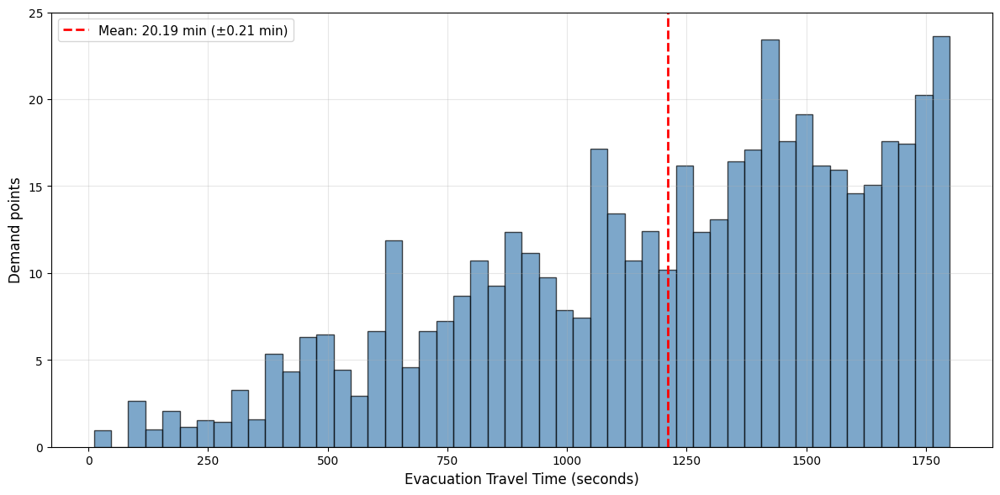


Evacuation Travel Time Distribution (per episode average):
  Total assignments (all 20 episodes): 9993
  Avg assignments per episode: 500
  Mean (from 20 episodes): 20.19 minutes
  Std Dev (from 20 episodes): 0.21 minutes
  Min: 0.19 minutes
  Max: 30.00 minutes


In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))
counts, bins, patches = ax.hist(evac_times_all, bins=50, color='steelblue', edgecolor='black', alpha=0.7)

for patch in patches:
    patch.set_height(patch.get_height() / 20)

ax.axvline(evac_distance_mean, color='red', linestyle='--', linewidth=2, 
           label=f'Mean: {evac_distance_mean/60:.2f} min (±{evac_distance_std/60:.2f} min)')

ax.set_xlabel('Evacuation Travel Time (seconds)', fontsize=12)
ax.set_ylabel('Demand points', fontsize=12)
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
plt.ylim(0,25)
plt.tight_layout()
plt.show()

print(f"\nEvacuation Travel Time Distribution (per episode average):")
print(f"  Total assignments (all 20 episodes): {len(evac_times_all)}")
print(f"  Avg assignments per episode: {len(evac_times_all)/20:.0f}")
print(f"  Mean (from 20 episodes): {evac_distance_mean/60:.2f} minutes")
print(f"  Std Dev (from 20 episodes): {evac_distance_std/60:.2f} minutes")
print(f"  Min: {np.min(evac_times_all)/60:.2f} minutes")
print(f"  Max: {np.max(evac_times_all)/60:.2f} minutes")

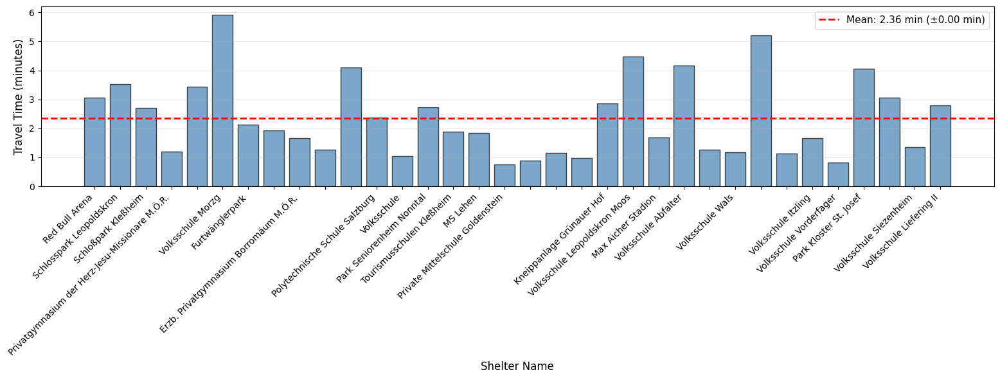


Shelter to Facility Travel Times (Last Episode):
  Number of shelters: 34
  Mean (from 20 episodes): 2.36 minutes
  Std Dev (from 20 episodes): 0.00 minutes
  Min (last episode): 0.76 minutes
  Max (last episode): 5.91 minutes


In [ ]:
selected_shelters = np.where(base_env.x_j == 1)[0]
shelter_to_facility_times = []
shelter_names = []

for j in selected_shelters:
    facility_distances = base_env.dlj_time[:, j]
    closest_facility_dist = np.nanmin(facility_distances)
    shelter_to_facility_times.append(closest_facility_dist)
    
    shelter_name = base_env.shelters.iloc[j].get('name', '')
    if pd.isna(shelter_name) or shelter_name == '':
        shelter_name = ''
    shelter_names.append(shelter_name)


plt.figure(figsize=(16, 6))
bars = plt.bar(range(len(selected_shelters)), 
               np.array(shelter_to_facility_times)/60,  # Convert to minutes
               color='steelblue', edgecolor='black', alpha=0.7)

plt.axhline(rescue_mean/60, color='red', linestyle='--', linewidth=2, 
            label=f'Mean: {rescue_mean/60:.2f} min (±{rescue_std/60:.2f} min)')

plt.xlabel('Shelter Name', fontsize=12)
plt.ylabel('Travel Time (minutes)', fontsize=12)
plt.xticks(range(len(selected_shelters)), shelter_names, rotation=45, ha='right')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

print(f"\nShelter to Facility Travel Times (Last Episode):")
print(f"  Number of shelters: {len(selected_shelters)}")
print(f"  Mean (from 20 episodes): {rescue_mean/60:.2f} minutes")
print(f"  Std Dev (from 20 episodes): {rescue_std/60:.2f} minutes")
print(f"  Min (last episode): {np.min(shelter_to_facility_times)/60:.2f} minutes")
print(f"  Max (last episode): {np.max(shelter_to_facility_times)/60:.2f} minutes")

#### Analytics

In [ ]:
log_dir = "./Final_Run_04092026/"
parser = tbparse.SummaryReader(log_dir)
scalars = parser.scalars

print(f"Scalars shape: {scalars.shape}")
print(f"Columns: {list(scalars.columns)}")
print(f"\nUnique tags available:")
if 'tag' in scalars.columns:
    unique_tags = scalars['tag'].unique()
    for tag in sorted(unique_tags):
        count = len(scalars[scalars['tag'] == tag])
        print(f"  - {tag} ({count} values)")
else:
    print(f"Available columns: {list(scalars.columns)}")
    print(scalars.head())

Scalars shape: (37488, 3)
Columns: ['step', 'tag', 'value']

Unique tags available:
  - episode/coverage (2205 values)
  - episode/length (2205 values)
  - episode/mean_coverage_window (2205 values)
  - episode/mean_length_window (2205 values)
  - episode/mean_reward_window (2205 values)
  - episode/reward (2205 values)
  - eval/mean_ep_length (1 values)
  - eval/mean_reward (1 values)
  - time/fps (2206 values)
  - train/approx_kl (2205 values)
  - train/clip_fraction (2205 values)
  - train/clip_range (2205 values)
  - train/clip_range_vf (2205 values)
  - train/entropy_loss (2205 values)
  - train/explained_variance (2205 values)
  - train/learning_rate (2205 values)
  - train/loss (2205 values)
  - train/policy_gradient_loss (2205 values)
  - train/value_loss (2205 values)


In [ ]:
metrics = {
    'episode/coverage': 'coverage',
    'episode/length': 'length',
    'episode/mean_coverage_window': 'mean_coverage_window',
    'episode/mean_length_window': 'mean_length_window',
    'episode/mean_reward_window': 'mean_reward_window',
    'episode/reward': 'episode_reward',
    'time/fps': 'fps',
    'train/approx_kl': 'approx_kl',
    'train/clip_fraction': 'clip_fraction',
    'train/clip_range': 'clip_range',
    'train/clip_range_vf': 'clip_range_vf',
    'train/entropy_loss': 'entropy_loss',
    'train/explained_variance': 'explained_variance',
    'train/learning_rate': 'learning_rate',
    'train/loss': 'loss',
    'train/policy_gradient_loss': 'policy_gradient_loss',
    'train/value_loss': 'value_loss',
}

metric_dfs = []
for tag, col_name in metrics.items():
    df = scalars[scalars['tag'] == tag].groupby('step')['value'].mean().reset_index()
    df.columns = ['step', col_name]
    metric_dfs.append(df)

all_metrics = reduce(lambda left, right: pd.merge(left, right, on='step', how='outer'), metric_dfs)

all_metrics.to_csv('tensorboard_metrics_all_final_run_04092026.csv', index=False)
print("Saved to 'tensorboard_metrics_all_final_run_04092026.csv'")

print(f"\nMetrics DataFrame shape: {all_metrics.shape}")
print("\nFirst few rows:")
print(all_metrics.head(10))
print("\nLast few rows:")
print(all_metrics.tail(10))
print("\nBasic statistics:")
print(all_metrics.describe())

✓ Saved to 'tensorboard_metrics_all_final_run_04092026.csv'

Metrics DataFrame shape: (2207, 18)

First few rows:
   step  coverage  length  mean_coverage_window  mean_length_window  \
0   136  0.651933    34.0              0.643348                34.0   
1   272  0.640690    34.0              0.639958                34.0   
2   408  0.645187    34.0              0.640824                34.0   
3   544  0.647928    34.0              0.641544                34.0   
4   680  0.653047    34.0              0.641540                34.0   
5   816  0.635865    34.0              0.640865                34.0   
6   952  0.658769    34.0              0.641207                34.0   
7  1088  0.644423    34.0              0.641411                34.0   
8  1224  0.651403    34.0              0.642354                34.0   
9  1360  0.638219    34.0              0.642401                34.0   

   mean_reward_window  episode_reward   fps  approx_kl  clip_fraction  \
0           -1.651910       -1.

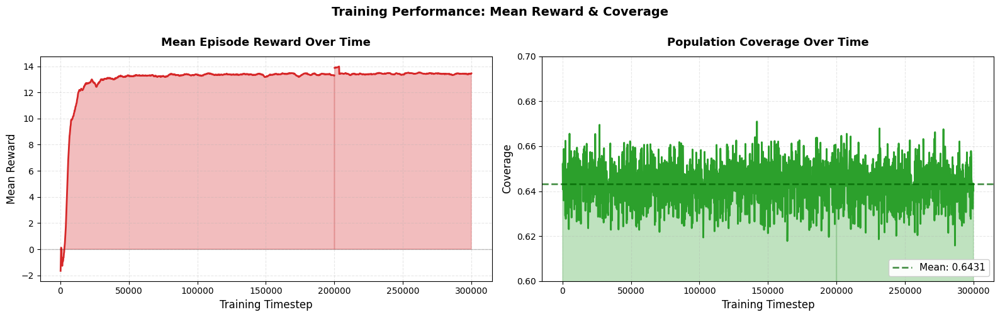

In [ ]:
def plot_training_metrics_simple(csv_path):
    df = pd.read_csv(csv_path)
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    fig.suptitle('Training Performance: Mean Reward & Coverage', 
                 fontsize=14, fontweight='bold', y=1.00)
    
    color_red = '#d62728'
    color_green = '#2ca02c'
    
    ax = axes[0]
    if 'mean_reward_window' in df.columns:
        ax.plot(df['step'], df['mean_reward_window'], color=color_red, linewidth=2)
        ax.fill_between(df['step'], df['mean_reward_window'], alpha=0.3, color=color_red)
        ax.set_xlabel('Training Timestep', fontsize=12)
        ax.set_ylabel('Mean Reward', fontsize=12)
        ax.set_title('Mean Episode Reward Over Time', fontsize=13, fontweight='bold', pad=12)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.axhline(y=0, color='black', linestyle='-', alpha=0.2, linewidth=1)
    
    ax = axes[1]
    if 'coverage' in df.columns:
        ax.plot(df['step'], df['coverage'], color=color_green, linewidth=2)
        ax.fill_between(df['step'], df['coverage'], alpha=0.3, color=color_green)
        mean_coverage = df['coverage'].mean()
        ax.axhline(y=mean_coverage, color='darkgreen', linestyle='--', linewidth=2, 
                   label=f'Mean: {mean_coverage:.4f}', alpha=0.7)
        ax.set_xlabel('Training Timestep', fontsize=12)
        ax.set_ylabel('Coverage', fontsize=12)
        ax.set_title('Population Coverage Over Time', fontsize=13, fontweight='bold', pad=12)
        ax.set_ylim(0.6, 0.7)
        ax.legend(loc='lower right', fontsize=11, framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.show()
    
    return fig

if __name__ == '__main__':
    csv_file = 'tensorboard_metrics_all_final_run_04092026.csv'
    fig = plot_training_metrics_simple(csv_path=csv_file)

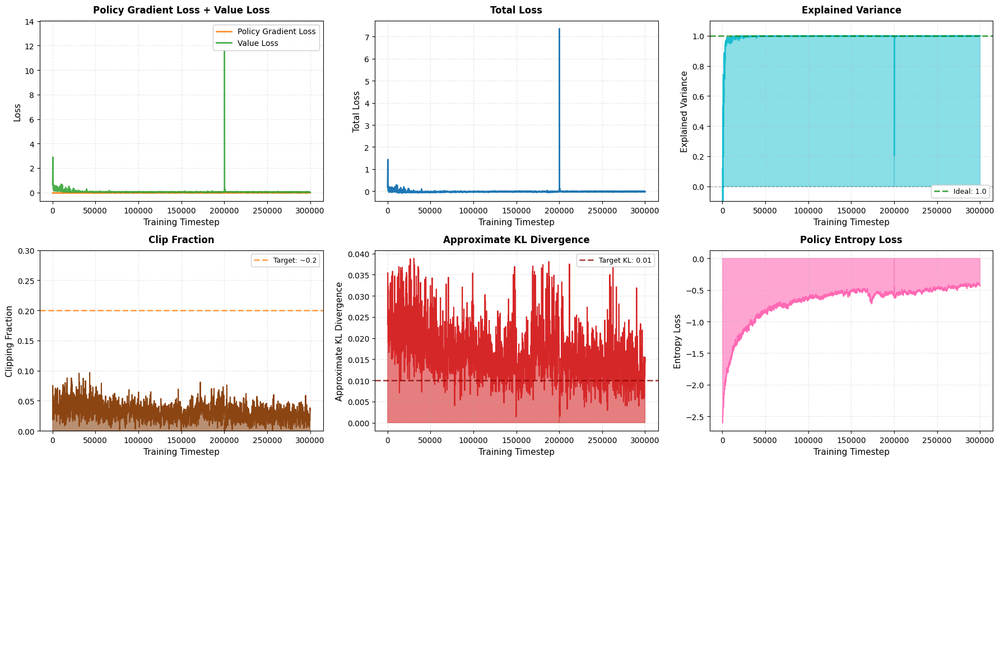

In [ ]:
def plot_ppo_diagnostics(csv_path):
    df = pd.read_csv(csv_path)
    
    fig, axes = plt.subplots(3, 3, figsize=(18, 12))
    axes_flat = axes.flatten()
    
    color_blue = '#1f77b4'
    color_red = '#d62728'
    color_green = '#2ca02c'
    color_orange = '#ff7f0e'
    color_cyan = '#17becf'
    color_brown = '#8b4513'
    color_pink = '#ff69b4'
    color_purple = '#9467bd'
    
    ax = axes_flat[0]
    if 'policy_gradient_loss' in df.columns and 'value_loss' in df.columns:
        ax.plot(df['step'], df['policy_gradient_loss'], color=color_orange, linewidth=2, 
               label='Policy Gradient Loss', alpha=0.85)
        ax.plot(df['step'], df['value_loss'], color=color_green, linewidth=2, 
               label='Value Loss', alpha=0.85)
        ax.set_xlabel('Training Timestep', fontsize=11)
        ax.set_ylabel('Loss', fontsize=11)
        ax.set_title('Policy Gradient Loss + Value Loss', fontsize=12, fontweight='bold', pad=10)
        ax.legend(loc='upper right', fontsize=10, framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
    
    ax = axes_flat[1]
    if 'loss' in df.columns:
        ax.fill_between(df['step'], df['loss'], alpha=0.5, color=color_blue)
        ax.plot(df['step'], df['loss'], color=color_blue, linewidth=2)
        ax.set_xlabel('Training Timestep', fontsize=11)
        ax.set_ylabel('Total Loss', fontsize=11)
        ax.set_title('Total Loss', fontsize=12, fontweight='bold', pad=10)
        ax.grid(True, alpha=0.3, linestyle='--')
    
    ax = axes_flat[2]
    if 'explained_variance' in df.columns:
        ax.fill_between(df['step'], df['explained_variance'], alpha=0.5, color=color_cyan)
        ax.plot(df['step'], df['explained_variance'], color=color_cyan, linewidth=2)
        ax.axhline(y=1.0, color='green', linestyle='--', alpha=0.7, linewidth=2, label='Ideal: 1.0')
        ax.axhline(y=0.0, color='black', linestyle='--', alpha=0.3, linewidth=1)
        ax.set_xlabel('Training Timestep', fontsize=11)
        ax.set_ylabel('Explained Variance', fontsize=11)
        ax.set_title('Explained Variance', fontsize=12, fontweight='bold', pad=10)
        ax.legend(loc='lower right', fontsize=9, framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_ylim(-0.1, 1.1)
    
    ax = axes_flat[3]
    if 'clip_fraction' in df.columns:
        ax.fill_between(df['step'], df['clip_fraction'], alpha=0.6, color=color_brown)
        ax.plot(df['step'], df['clip_fraction'], color=color_brown, linewidth=1.5)
        ax.axhline(y=0.2, color=color_orange, linestyle='--', linewidth=2, alpha=0.7, label='Target: ~0.2')
        ax.set_xlabel('Training Timestep', fontsize=11)
        ax.set_ylabel('Clipping Fraction', fontsize=11)
        ax.set_title('Clip Fraction', fontsize=12, fontweight='bold', pad=10)
        ax.legend(loc='upper right', fontsize=9, framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_ylim(0, 0.3)
    
    ax = axes_flat[4]
    if 'approx_kl' in df.columns:
        ax.fill_between(df['step'], df['approx_kl'], alpha=0.6, color=color_red)
        ax.plot(df['step'], df['approx_kl'], color=color_red, linewidth=1.5)
        ax.axhline(y=0.01, color='darkred', linestyle='--', linewidth=2, alpha=0.7, label='Target KL: 0.01')
        ax.set_xlabel('Training Timestep', fontsize=11)
        ax.set_ylabel('Approximate KL Divergence', fontsize=11)
        ax.set_title('Approximate KL Divergence', fontsize=12, fontweight='bold', pad=10)
        ax.legend(loc='upper right', fontsize=9, framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
    
    ax = axes_flat[5]
    if 'entropy_loss' in df.columns:
        ax.fill_between(df['step'], df['entropy_loss'], alpha=0.6, color=color_pink)
        ax.plot(df['step'], df['entropy_loss'], color=color_pink, linewidth=1.5)
        ax.set_xlabel('Training Timestep', fontsize=11)
        ax.set_ylabel('Entropy Loss', fontsize=11)
        ax.set_title('Policy Entropy Loss', fontsize=12, fontweight='bold', pad=10)
        ax.grid(True, alpha=0.3, linestyle='--')
    
    for idx in range(6, 9):
        axes_flat[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return fig


if __name__ == '__main__':
    csv_file = 'tensorboard_metrics_all_final_run_04092026.csv'
    fig = plot_ppo_diagnostics(csv_path=csv_file)

#### Mapping results

In [ ]:
model = MaskablePPO.load("iam_ppo_model_tuned_Final_Run_04092026", device="cuda")

test_env_single = make_env()
obs, info = test_env_single.reset()
episode_done = False

shelter_selection_order = []
coverage_history = []
reward_history = []

while not episode_done:
    action_mask = info.get("action_mask", np.ones(test_env_single.action_space.n, dtype=bool))
    action, _ = model.predict(obs, action_masks=action_mask, deterministic=True)
    action = int(action)
    
    obs, reward, terminated, truncated, info = test_env_single.step(action)
    episode_done = terminated or truncated
    
    shelter_selection_order.append(action)
    coverage_history.append(info.get("coverage", 0.0))
    reward_history.append(reward)

env_base = test_env_single.unwrapped
selected_shelters = np.where(env_base.x_j == 1)[0]
primary_ij = env_base.primary_ij.copy()
ai = env_base.ai.copy()
b_j = env_base.b_j.copy()
test_env_single.close()

allocated_demands = np.sum(primary_ij >= 0)
total_demands = len(demand_points)

print(f"Episode complete: {allocated_demands}/{total_demands} demands allocated | Coverage: {coverage_history[-1]:.4f}")

Episode complete: 504/835 demands allocated | Coverage: 0.6366


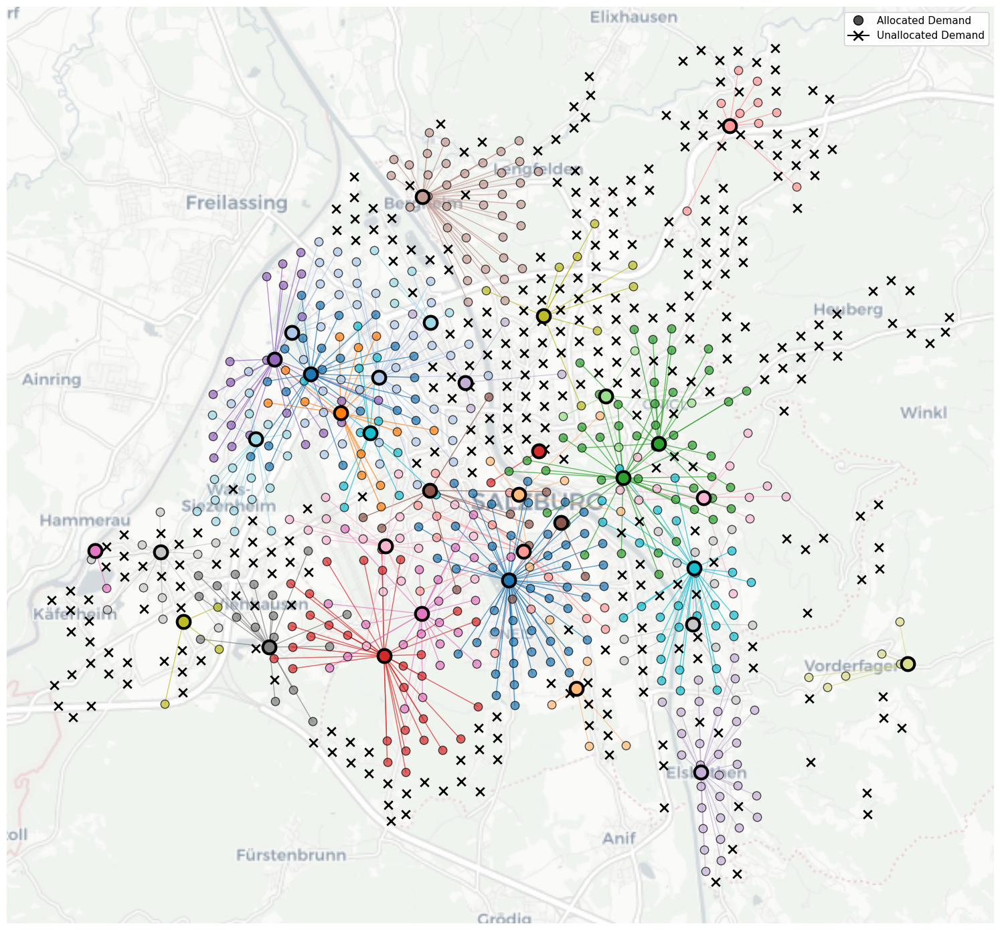

In [ ]:
#Coordinates are in UTM Zone 33N (EPSG:32633), not WGS84
demands_gdf = gpd.GeoDataFrame(
    demand_points,
    geometry=[Point(xy) for xy in zip(demand_points['x'], demand_points['y'])],
    crs='EPSG:32633'
)

shelters_gdf = gpd.GeoDataFrame(
    shelters_sorted,
    geometry=[Point(xy) for xy in zip(shelters_sorted['x'], shelters_sorted['y'])],
    crs='EPSG:32633'
)

#Reproject to Web Mercator for contextily
demands_gdf = demands_gdf.to_crs('EPSG:3857')
shelters_gdf = shelters_gdf.to_crs('EPSG:3857')

fig, ax = plt.subplots(figsize=(16, 14))

demands_gdf.plot(ax=ax, alpha=0) 

source = (
    "https://a.basemaps.cartocdn.com/"
    "rastertiles/light_all/{z}/{x}/{y}.png"
    f"?key={api_key}"
)
ctx.add_basemap(
    ax,
    source=source,
    zoom=12
)

colors = plt.cm.tab20(np.linspace(0, 1, len(selected_shelters)))
shelter_colors = {sid: colors[i] for i, sid in enumerate(selected_shelters)}

for demand_idx, row in demands_gdf.iterrows():
    assigned_shelter = primary_ij[demand_idx]
    
    if assigned_shelter >= 0:  # Demand is allocated
        shelter_row = shelters_gdf.iloc[assigned_shelter]
        color = shelter_colors.get(assigned_shelter, '#999999')
        
        # Draw line from demand to shelter
        ax.plot([row.geometry.x, shelter_row.geometry.x], 
               [row.geometry.y, shelter_row.geometry.y], 
               color=color, alpha=0.7, linewidth=1, zorder=1)
        
        # Plot demand point
        ax.scatter(row.geometry.x, row.geometry.y, s=80, color=color, 
                  alpha=0.7, marker='o', edgecolors='black', linewidth=1, zorder=2)
    else:  # Demand not allocated
        ax.scatter(row.geometry.x, row.geometry.y, s=80, color="#000000", 
                  alpha=0.99, marker='x', linewidth=2, zorder=2)

for idx, row in shelters_gdf.iterrows():
    if idx in selected_shelters:
        ax.scatter(row.geometry.x, row.geometry.y, s=800, color=shelter_colors[idx], 
                  alpha=0.99, marker='.', edgecolors='black', linewidth=3, zorder=4)
    else:
        ax.scatter(row.geometry.x, row.geometry.y, s=400, color="#5100FF", 
                  alpha=0.99, marker='v', edgecolors='gray', linewidth=1, zorder=1)


ax.set_xlabel('')
ax.set_ylabel('')

legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#4D4D4D', 
           markersize=10, label='Allocated Demand', markeredgecolor='black'),
    Line2D([0], [0], marker='x', color="#000000", markersize=10, 
           label='Unallocated Demand', markeredgewidth=2),
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=11, framealpha=0.95)

plt.axis('off')
plt.tight_layout()
plt.show()

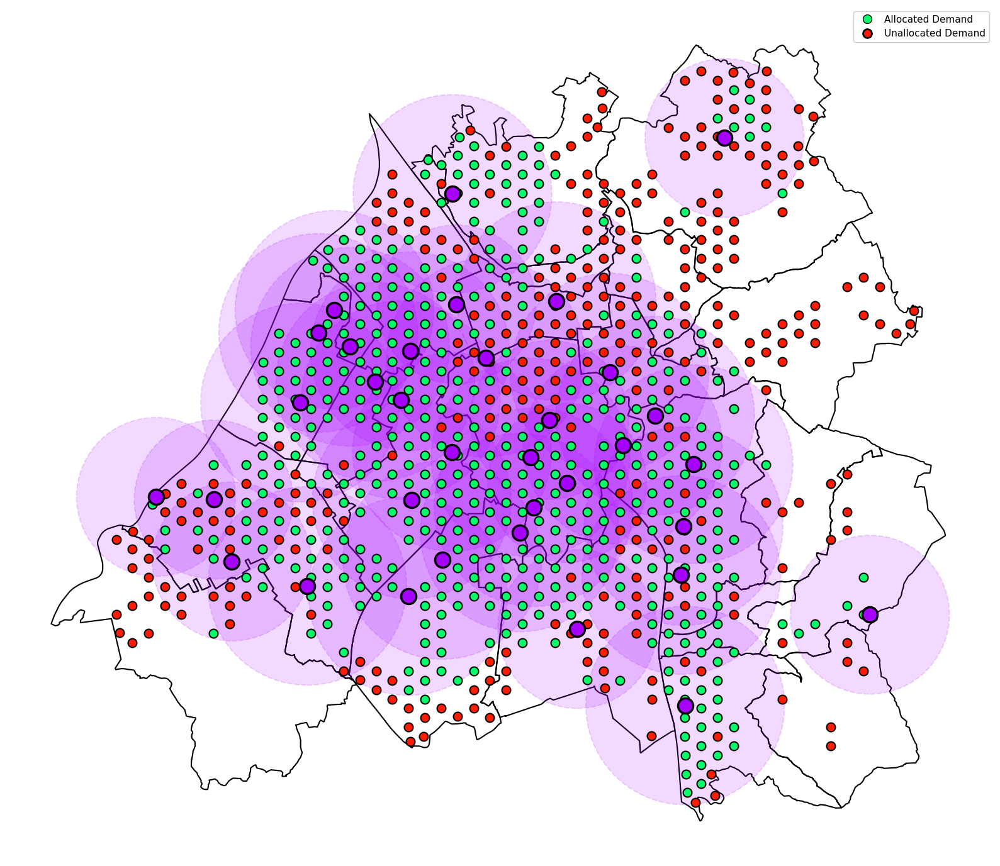

In [ ]:
#Plot in EPSG:32633 (UTM Zone 33N) for true distance accuracy

# Create GeoDataFrames in EPSG:32633 (no reprojection)
demands_gdf_utm = gpd.GeoDataFrame(
    demand_points,
    geometry=[Point(xy) for xy in zip(demand_points['x'], demand_points['y'])],
    crs='EPSG:32633'
)
shelters_gdf_utm = gpd.GeoDataFrame(
    shelters_sorted,
    geometry=[Point(xy) for xy in zip(shelters_sorted['x'], shelters_sorted['y'])],
    crs='EPSG:32633'
)
#Shapefile
polygon_gdf = gpd.read_file(r"C:/Users/pavol/DiplomskiRad/Kod/PolygonData/District.shp")

#Ensure CRS matches map (EPSG:32633)
if polygon_gdf.crs != "EPSG:32633":
    polygon_gdf = polygon_gdf.to_crs("EPSG:32633")

fig, ax = plt.subplots(figsize=(16, 14))
demands_gdf_utm.plot(ax=ax, alpha=0, zorder=0)  

from matplotlib.patches import Circle
for idx, row in shelters_gdf_utm.iterrows():
    if idx in selected_shelters:
        service_radius = shelters_sorted.iloc[idx]['ServiceTime']
        circle = Circle((row.geometry.x, row.geometry.y), radius=service_radius,
                       color='#A600FF', alpha=0.15, zorder=1, linewidth=1.5,
                       edgecolor='#A600FF', linestyle='--')
        ax.add_patch(circle)

for demand_idx, row in demands_gdf_utm.iterrows():
    if primary_ij[demand_idx] >= 0:  # Allocated
        ax.scatter(row.geometry.x, row.geometry.y, s=100, color="#00FF6A",
                  alpha=0.99, marker='o', edgecolors='black', linewidth=1.5, zorder=2)
    else:  # Not allocated
        ax.scatter(row.geometry.x, row.geometry.y, s=100, color="#FF1900",
                  alpha=0.99, marker='o', edgecolors='black', linewidth=1.5, zorder=2)

for idx, row in shelters_gdf_utm.iterrows():
    if idx in selected_shelters:  # Selected
        ax.scatter(row.geometry.x, row.geometry.y, s=300, color="#A600FF",
                  alpha=0.99, marker='o', edgecolors='black', linewidth=2.5, zorder=4)
    else:  # Not selected
        ax.scatter(row.geometry.x, row.geometry.y, s=200, color="#0015FF",
                  alpha=0.99, marker='o', edgecolors='black', linewidth=1, zorder=1)
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#00FF6A', 
           markersize=10, label='Allocated Demand', markeredgecolor='black'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor="#FF1900", markersize=10, 
           label='Unallocated Demand', markeredgecolor='black', markeredgewidth=2),
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=11, framealpha=0.95)


plt.axis('off')  # True aspect ratio for UTM
polygon_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1.5, zorder=0)
plt.tight_layout()
plt.show()

In [ ]:
shelter_info = []
for step, shelter_id in enumerate(shelter_selection_order, 1):
    # Calculate population allocated to this shelter
    allocated_pop = np.sum(ai[primary_ij == shelter_id])
    capacity = b_j[shelter_id]
    utilization = (allocated_pop / capacity * 100) if capacity > 0 else 0
    
    info_dict = {
        'Selection_Order': step,
        'Shelter_ID': shelter_id,
        'Capacity': capacity,
        'Allocated_Population': allocated_pop,
        'Utilization_%': utilization,
        'Available_Capacity': capacity - allocated_pop
    }
    shelter_info.append(info_dict)
    
    print(f"Step {step}: Shelter {shelter_id:3d} | "
          f"Capacity: {capacity:8.0f} | "
          f"Allocated: {allocated_pop:8.0f} | "
          f"Utilization: {utilization:6.2f}% | "
          f"Available: {capacity - allocated_pop:8.0f}")

# Convert to DataFrame for easier viewing
shelter_df = pd.DataFrame(shelter_info)
print("\nShelter Selection Details:")
print(shelter_df.to_string(index=False))

shelter_df.to_csv('shelter_selection_order.csv', index=False)
print("\n✓ Shelter selection order saved to 'shelter_selection_order.csv'")

print(f"Total shelters selected: {len(selected_shelters)}")
print(f"Total demands allocated: {allocated_demands}/{total_demands}")
print(f"Coverage: {coverage_history[-1]:.4f}")
print(f"Average utilization: {shelter_df['Utilization_%'].mean():.2f}%")


SHELTER SELECTION ORDER & CAPACITY UTILIZATION
Step 1: Shelter  10 | Capacity:     8379 | Allocated:     1677 | Utilization:  20.01% | Available:     6702
Step 2: Shelter   5 | Capacity:      291 | Allocated:      284 | Utilization:  97.65% | Available:        7
Step 3: Shelter  11 | Capacity:       75 | Allocated:       50 | Utilization:  66.70% | Available:       25
Step 4: Shelter   6 | Capacity:      703 | Allocated:      662 | Utilization:  94.07% | Available:       42
Step 5: Shelter  18 | Capacity:     1067 | Allocated:     1062 | Utilization:  99.49% | Available:        5
Step 6: Shelter  26 | Capacity:     1152 | Allocated:     1139 | Utilization:  98.83% | Available:       14
Step 7: Shelter  14 | Capacity:     2598 | Allocated:     2534 | Utilization:  97.54% | Available:       64
Step 8: Shelter  22 | Capacity:     2454 | Allocated:     2453 | Utilization:  99.96% | Available:        1
Step 9: Shelter  30 | Capacity:     3324 | Allocated:     3323 | Utilization:  99.99% | 

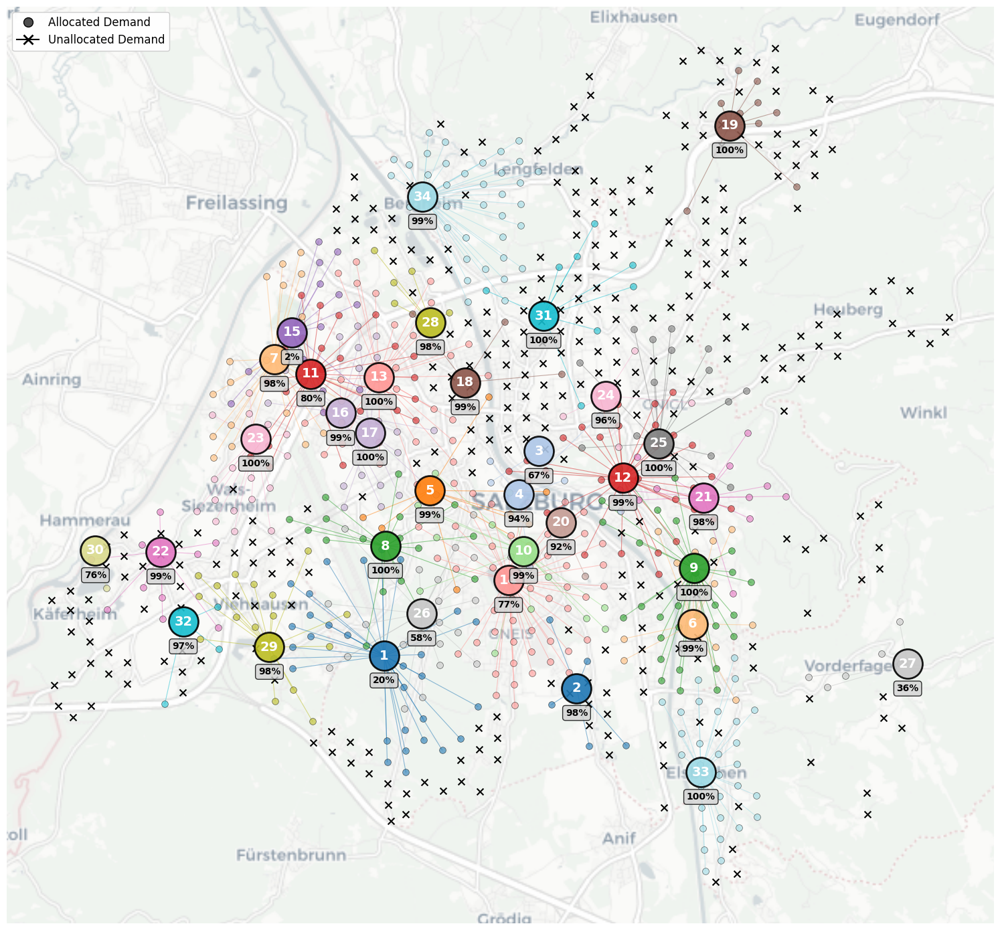


✓ Shelter selection order saved to 'shelter_selection_order.csv'


In [ ]:
demands_gdf = gpd.GeoDataFrame(
    demand_points,
    geometry=[Point(xy) for xy in zip(demand_points['x'], demand_points['y'])],
    crs='EPSG:32633'
)

shelters_gdf = gpd.GeoDataFrame(
    shelters_sorted,
    geometry=[Point(xy) for xy in zip(shelters_sorted['x'], shelters_sorted['y'])],
    crs='EPSG:32633'
)

#Reproject to Web Mercator for contextily
demands_gdf = demands_gdf.to_crs('EPSG:3857')
shelters_gdf = shelters_gdf.to_crs('EPSG:3857')

fig, ax = plt.subplots(figsize=(16, 14))

demands_gdf.plot(ax=ax, alpha=0)

source = (
    "https://a.basemaps.cartocdn.com/"
    "rastertiles/light_all/{z}/{x}/{y}.png"
    f"?key={api_key}"
)
ctx.add_basemap(
    ax,
    source=source,
    zoom=12
)

selection_order_map = {shelter_id: step for step, shelter_id in enumerate(shelter_selection_order, 1)}

colors = plt.cm.tab20(np.linspace(0, 1, len(selected_shelters)))
shelter_colors = {sid: colors[selection_order_map[sid] - 1] for sid in selected_shelters}

for demand_idx, row in demands_gdf.iterrows():
    assigned_shelter = primary_ij[demand_idx]
    
    if assigned_shelter >= 0:  # Demand is allocated
        shelter_row = shelters_gdf.iloc[assigned_shelter]
        color = shelter_colors.get(assigned_shelter, '#999999')
        
        # Draw line from demand to shelter
        ax.plot([row.geometry.x, shelter_row.geometry.x], 
               [row.geometry.y, shelter_row.geometry.y], 
               color=color, alpha=0.5, linewidth=0.8, zorder=1)
        
        
        ax.scatter(row.geometry.x, row.geometry.y, s=50, color=color, 
                  alpha=0.6, marker='o', edgecolors='black', linewidth=0.5, zorder=2)
    else:  
        ax.scatter(row.geometry.x, row.geometry.y, s=50, color="#000000", 
                  alpha=0.99, marker='x', linewidth=1.5, zorder=2)

for idx, row in shelters_gdf.iterrows():
    if idx in selected_shelters:
        color = shelter_colors[idx]
        order = selection_order_map[idx]
        utilization = shelter_df[shelter_df['Shelter_ID'] == idx]['Utilization_%'].values[0]
        
       
        ax.scatter(row.geometry.x, row.geometry.y, s=1000, color=color, 
                  alpha=0.9, marker='o', edgecolors='black', linewidth=2, zorder=4)
          
        ax.text(row.geometry.x, row.geometry.y, str(order), 
               fontsize=14, fontweight='bold', ha='center', va='center', 
               color='white', zorder=5)
        
        ax.text(row.geometry.x, row.geometry.y - 700, f'{utilization:.0f}%', 
               fontsize=10, ha='center', va='bottom', fontweight='bold',
               bbox=dict(boxstyle='round', facecolor='lightgrey', alpha=0.8), zorder=5)
    else:
        ax.scatter(row.geometry.x, row.geometry.y, s=400, color="#5100FF", 
                  alpha=0.5, marker='v', edgecolors='gray', linewidth=1, zorder=1)

ax.set_xlabel('')
ax.set_ylabel('')

legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#4D4D4D', 
           markersize=10, label='Allocated Demand', markeredgecolor='black'),
    Line2D([0], [0], marker='x', color="#000000", markersize=10, 
           label='Unallocated Demand', markeredgewidth=2),
]
ax.legend(handles=legend_elements, loc='upper left', fontsize=12, framealpha=0.95)

plt.axis('off')
plt.tight_layout()
plt.show()

shelter_df.to_csv('shelter_selection_order.csv', index=False)
print("\n✓ Shelter selection order saved to 'shelter_selection_order.csv'")

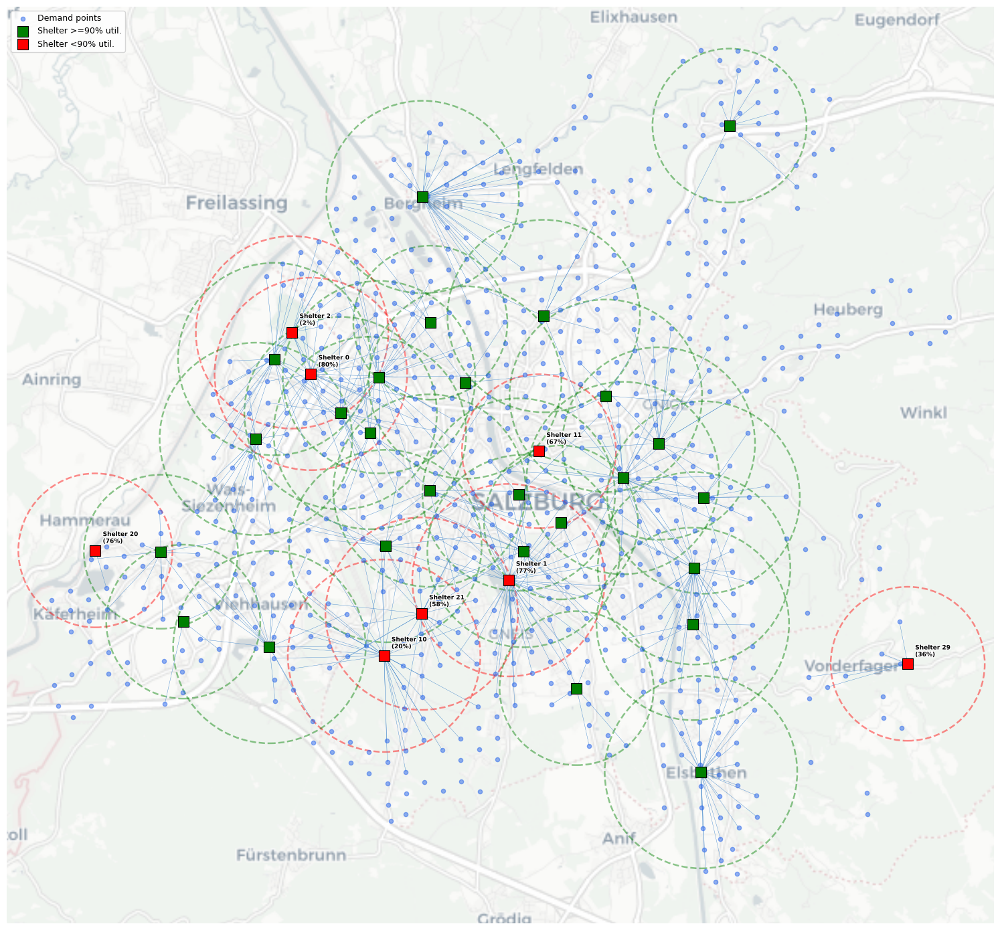

In [ ]:
demands_gdf = gpd.GeoDataFrame(
    demand_points,
    geometry=[Point(xy) for xy in zip(demand_points['x'], demand_points['y'])],
    crs='EPSG:32633'
)

shelters_gdf = gpd.GeoDataFrame(
    shelters_sorted,
    geometry=[Point(xy) for xy in zip(shelters_sorted['x'], shelters_sorted['y'])],
    crs='EPSG:32633'
)

#Reproject to Web Mercator for contextily
demands_gdf = demands_gdf.to_crs('EPSG:3857')
shelters_gdf = shelters_gdf.to_crs('EPSG:3857')

fig, ax = plt.subplots(figsize=(16, 14))

demands_gdf.plot(ax=ax, alpha=0)

source = (
    "https://a.basemaps.cartocdn.com/"
    "rastertiles/light_all/{z}/{x}/{y}.png"
    f"?key={api_key}"
)
ctx.add_basemap(ax, source=source, zoom=12, zorder=0)

#Using reprojected coordinates
sx_web = shelters_gdf.geometry.x.values
sy_web = shelters_gdf.geometry.y.values
sr = shelters_sorted['ServiceTime'].values

under_90_shelter_ids = set(shelter_df[shelter_df['Utilization_%'] < 90]['Shelter_ID'].values)

for j in range(len(shelters_gdf)):
    colour = 'red' if j in under_90_shelter_ids else 'green'
    circle = Circle((sx_web[j], sy_web[j]), sr[j]*1.27,
                     fill=False, edgecolor=colour, linewidth=1.8,
                     linestyle='--', alpha=0.45, zorder=1)
    ax.add_patch(circle)

lines = []
for i in range(len(demands_gdf)):
    if primary_ij[i] >= 0:
        j = primary_ij[i]
        lines.append([
            (demands_gdf.geometry.iloc[i].x, demands_gdf.geometry.iloc[i].y),
            (shelters_gdf.geometry.iloc[j].x, shelters_gdf.geometry.iloc[j].y)
        ])

if lines:
    lc = LineCollection(lines, colors='#4488cc', linewidths=0.3, alpha=1, zorder=2)
    ax.add_collection(lc)

demands_gdf.plot(ax=ax, color='#2563EB', markersize=20, alpha=0.5, zorder=3, label='Demand points')

mask_ok = [j for j in range(len(shelters_gdf)) if j not in under_90_shelter_ids]
if mask_ok:
    shelters_gdf.iloc[mask_ok].plot(ax=ax, color='green', markersize=120, marker='s',
                                    edgecolor='black', linewidth=0.8, zorder=5, label='Shelter >=90% util.')

mask_low = list(under_90_shelter_ids)
if mask_low:
    shelters_gdf.iloc[mask_low].plot(ax=ax, color='red', markersize=120, marker='s',
                                     edgecolor='black', linewidth=0.8, zorder=5, label='Shelter <90% util.')

for shelter_id in under_90_shelter_ids:
    util_pct = shelter_df[shelter_df['Shelter_ID'] == shelter_id]['Utilization_%'].values[0]
    shelter_name = f"Shelter {shelter_id}"
    label_txt = f"{shelter_name}\n({util_pct:.0f}%)"
    ax.annotate(label_txt, (sx_web[shelter_id], sy_web[shelter_id]),
                textcoords='offset points', xytext=(8, 8),
                fontsize=6.5, fontweight='bold',
                path_effects=[pe.withStroke(linewidth=2, foreground='white')], zorder=6)


ax.legend(loc='upper left', fontsize=9)
ax.axis('off')
plt.tight_layout()
plt.show()

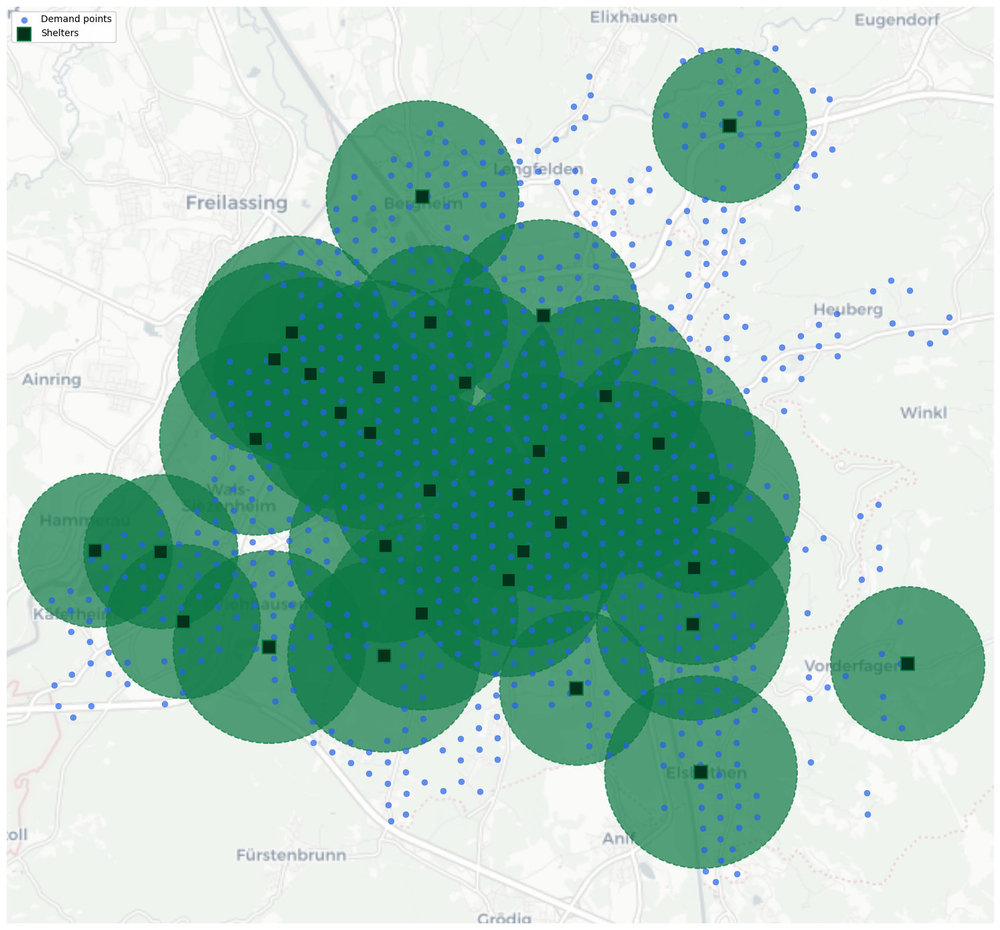

In [ ]:
demands_gdf = gpd.GeoDataFrame(
    demand_points,
    geometry=[Point(xy) for xy in zip(demand_points['x'], demand_points['y'])],
    crs='EPSG:32633'
)

shelters_gdf = gpd.GeoDataFrame(
    shelters_sorted,
    geometry=[Point(xy) for xy in zip(shelters_sorted['x'], shelters_sorted['y'])],
    crs='EPSG:32633'
)

#Reproject to Web Mercator for contextily
demands_gdf = demands_gdf.to_crs('EPSG:3857')
shelters_gdf = shelters_gdf.to_crs('EPSG:3857')

fig, ax = plt.subplots(figsize=(16, 14))

demands_gdf.plot(ax=ax, alpha=0)

source = (
    "https://a.basemaps.cartocdn.com/"
    "rastertiles/light_all/{z}/{x}/{y}.png"
    f"?key={api_key}"
)
ctx.add_basemap(ax, source=source, zoom=12)

for idx, row in shelters_gdf.iterrows():
    sr = shelters_sorted.iloc[idx]['ServiceTime']
    circle = Circle((row.geometry.x, row.geometry.y), sr*1.27,
                     fill=True, facecolor='#0C7944', edgecolor='#0C7944', linewidth=1.5,
                     linestyle='--', alpha=0.7, zorder=2)
    ax.add_patch(circle)

demands_gdf.plot(ax=ax, color='#2563EB', markersize=40, alpha=0.7, 
                 edgecolor='#2563EB', linewidth=0.5, zorder=3, label='Demand points')

shelters_gdf.plot(ax=ax, color="#02321B", markersize=200, marker='s', alpha=1,
                  edgecolor='#0C7944', linewidth=1.5, zorder=4, label='Shelters')

ax.legend(loc='upper left', fontsize=10, framealpha=0.95)
ax.axis('off')
plt.tight_layout()
plt.show()

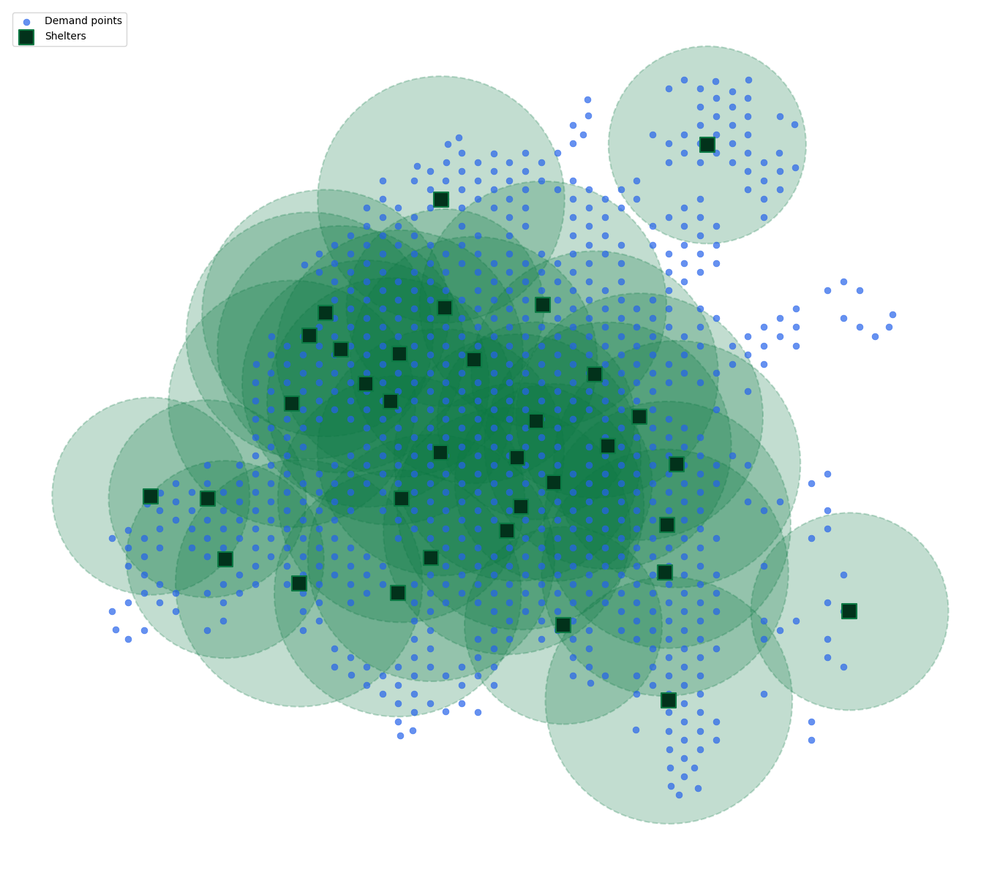

In [ ]:
demands_utm = demands_gdf.to_crs("EPSG:32633")
shelters_utm = shelters_gdf.to_crs("EPSG:32633")

fig, ax = plt.subplots(figsize=(14, 12))

for idx, row in shelters_utm.iterrows():

    #Service time in seconds
    radius_m = row["ServiceTime"] * 1.27

    circle = Circle(
        (row.geometry.x, row.geometry.y),
        radius_m,
        fill=True,
        facecolor="#0C7944",
        edgecolor="#0C7944",
        linewidth=1.5,
        linestyle="--",
        alpha=0.25,
        zorder=2
    )

    ax.add_patch(circle)

demands_utm.plot(
    ax=ax,
    color="#2563EB",
    markersize=40,
    alpha=0.7,
    edgecolor="#2563EB",
    linewidth=0.5,
    zorder=3,
    label="Demand points"
)

shelters_utm.plot(
    ax=ax,
    color="#02321B",
    markersize=200,
    marker="s",
    edgecolor="#0C7944",
    linewidth=1.5,
    zorder=4,
    label="Shelters"
)


ax.set_aspect("equal")
ax.set_axis_off()
ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

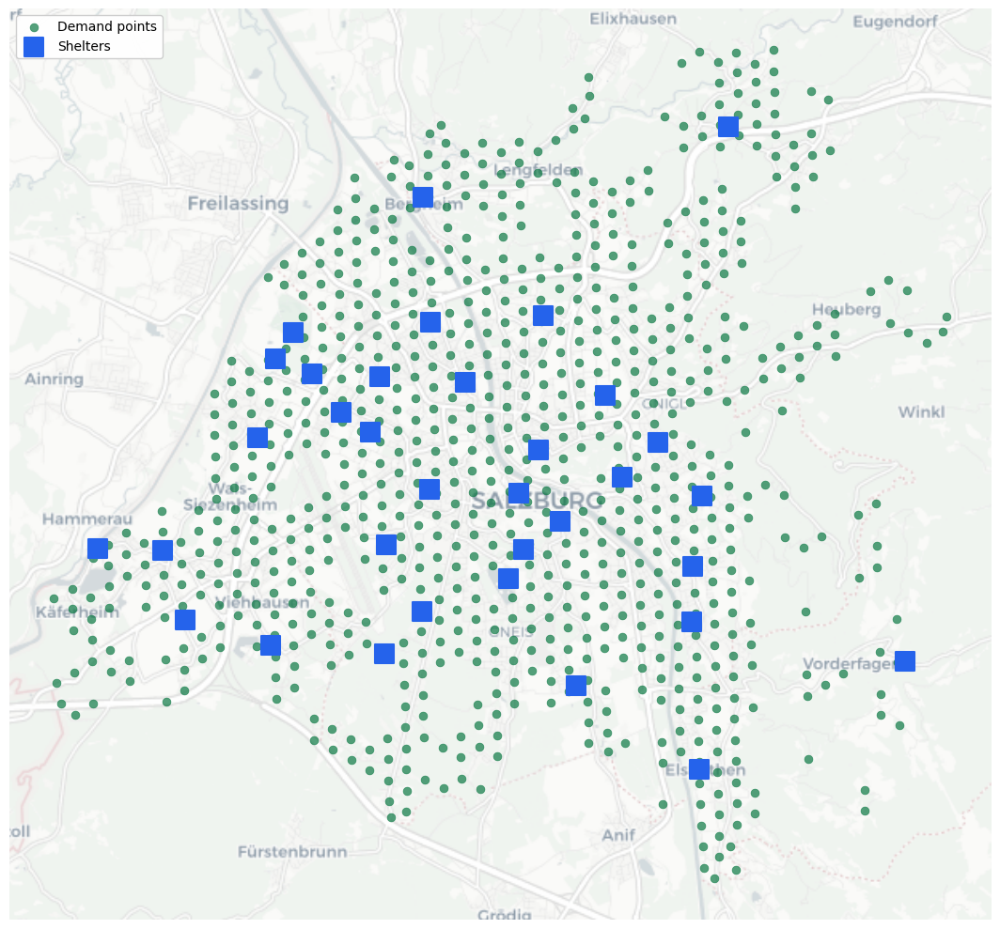

In [ ]:
demands_gdf = gpd.GeoDataFrame(
    demand_points,
    geometry=[Point(xy) for xy in zip(demand_points['x'], demand_points['y'])],
    crs='EPSG:32633'
)

shelters_gdf = gpd.GeoDataFrame(
    shelters_sorted,
    geometry=[Point(xy) for xy in zip(shelters_sorted['x'], shelters_sorted['y'])],
    crs='EPSG:32633'
)

#Reproject to Web Mercator for contextily
demands_gdf = demands_gdf.to_crs('EPSG:3857')
shelters_gdf = shelters_gdf.to_crs('EPSG:3857')

fig, ax = plt.subplots(figsize=(12, 10))

demands_gdf.plot(ax=ax, alpha=0)

source = (
    "https://a.basemaps.cartocdn.com/"
    "rastertiles/light_all/{z}/{x}/{y}.png"
    f"?key={api_key}"
)
ctx.add_basemap(ax, source=source, zoom=12)


demands_gdf.plot(ax=ax, color="#0C7944", markersize=40, alpha=0.7, 
                 edgecolor='#0C7944', linewidth=0.5, zorder=3, label='Demand points')

shelters_gdf.plot(ax=ax, color='#2563EB', markersize=200, marker='s', alpha=1,
                  edgecolor='#2563EB', linewidth=1.5, zorder=4, label='Shelters')


ax.legend(loc='upper left', fontsize=10, framealpha=0.95)
ax.axis('off')
plt.tight_layout()
plt.show()

#### ArcGISPro Calculations

In [36]:
import pandas as pd

# Import CSV file as dataframe (using semicolon delimiter)
df = pd.read_csv(r'C:\Users\pavol\DiplomskiRad\Kod\ArcGISRuns\LinesMaxCoverage.csv', sep=';')

# Check actual column names
print("Actual column names:")
print(df.columns.tolist())
print("\nDataframe head:")
print(df.head())

# Strip whitespace from column names
df.columns = df.columns.str.strip()

# Sum PopulationSituated column
covered_population = df['PopulationSituated'].sum()

# Variable storing the value 105982
total_population = 105982

# Average of TotalTimeSec
avg_time = df['TotalTimeSec'].mean()

Coverage_percentage = (covered_population / total_population) * 100

print(f"Coverage Percentage: {Coverage_percentage:.2f}%")
print(f"Average Time (seconds): {avg_time}")

Actual column names:
['Name', 'FacilityID', 'DemandID', 'Weight', 'TotalWeighted_Length', 'TotalWeighted_Time_Seconds', 'Total_Length', 'Total_Time_Seconds', 'Shape_Length', 'PopulationSituated', 'TotalTimeSec']

Dataframe head:
                            Name  FacilityID  DemandID  \
0   Location 97 - Red Bull Arena           1        97   
1  Location 188 - Red Bull Arena           1       188   
2  Location 189 - Red Bull Arena           1       189   
3  Location 200 - Red Bull Arena           1       200   
4  Location 290 - Red Bull Arena           1       290   

                    Weight  TotalWeighted_Length   TotalWeighted_Time_Seconds  \
0  215,193,710,327,148,000                   NaN  177,291,882,846,683,000,000   
1  205,170,303,344,726,000                   NaN  154,343,140,497,109,000,000   
2  110,236,061,096,191,000                   NaN   43,192,695,259,098,500,000   
3  534,250,854,492,187,000                   NaN  942,781,961,138,588,000,000   
4  360,118,499,75

In [40]:
import csv
import statistics

# Read the CSV file
data = []
with open(r'C:\Users\pavol\DiplomskiRad\Kod\ArcGISRuns\LinesMaxCoverage.csv', 'r', encoding='utf-8-sig') as f:
    reader = csv.DictReader(f, delimiter=';')
    for row in reader:
        data.append(row)

# Extract metrics
facility_ids = set()
populations = []
times = []

for row in data:
    facility_ids.add(row['FacilityID'])
    populations.append(float(row['PopulationSituated']))
    times.append(float(row['TotalTimeSec']))

# Calculate metrics
num_shelters = len(facility_ids)
total_population_allocated = sum(populations)
avg_evacuation_distance = statistics.mean(times)
max_time = max(times)
min_time = min(times)

print("=" * 60)
print("MINIMIZE DISTANCE (P-MEDIAN) - RESULTS")
print("=" * 60)
print(f"\nNumber of Shelters Selected: {num_shelters}")
print(f"Total Population Allocated: {total_population_allocated:,.2f}")
print(f"Number of Demand Points Served: {len(data)}")
print(f"\nAverage Evacuation Distance (Time): {avg_evacuation_distance:.2f} seconds")
print(f"  ({avg_evacuation_distance/60:.2f} minutes)")
print(f"\nMin Evacuation Time: {min_time:.2f} seconds ({min_time/60:.2f} minutes)")
print(f"Max Evacuation Time: {max_time:.2f} seconds ({max_time/60:.2f} minutes)")
print("=" * 60)

MINIMIZE DISTANCE (P-MEDIAN) - RESULTS

Number of Shelters Selected: 34
Total Population Allocated: 66,883.65
Number of Demand Points Served: 478

Average Evacuation Distance (Time): 942.30 seconds
  (15.70 minutes)

Min Evacuation Time: 11.39 seconds (0.19 minutes)
Max Evacuation Time: 1794.83 seconds (29.91 minutes)
